In [ ]:
import itertools
import pickle
import numpy as np
from compute_RSA import calculate_RSA
import matplotlib.pyplot as plt
from plot_RSA_layers import filter_rsa_data
import matplotlib.patheffects as path_effects

ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]
roi = ["V1", "EBA", "${\\text{LOT}}_{bio}$", "${\\text{SMG}}_{lh}$"]
MRI_RDMs = np.zeros((15, len(ROIList), 6, 6))

nsub = 0
for sub in range(2, 18):
    if sub == 8:
        continue
    subject = f"S{sub:02d}"

    for r, region in enumerate(ROIList):
        hem = "all"

        if "SMG" in region:
            region, hem = region.split("_")

        RDM_folder = f"result/fMRI RDM/pearson/{region}"

        if region == "behavior":
            with open(f"{RDM_folder}/RDM_dynamic.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)
        else:
            with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)

        MRI_RDMs[nsub, r, :, :] = dynamic_RDM
    nsub += 1

MRI_RSA = np.ones((15, len(ROIList), len(ROIList)))
combinations = list(itertools.combinations(range(len(ROIList)), 2))
for s in range(15):
    for c1, c2 in combinations:
        RSA, _ = calculate_RSA(MRI_RDMs[s, c1, :, :], MRI_RDMs[s, c2, :, :])
        MRI_RSA[s, c1, c2] = MRI_RSA[s, c2, c1] = RSA

MRI_RSA = np.mean(MRI_RSA, axis=0)

In [ ]:
condition = ["F_wx", "S_wx", "S_nox", "S_1", "Dorsal"]
dataset = ["k400"]

model_RDMs = np.zeros((len(condition), 6, 6))

for c, cond in enumerate(condition):
    if cond in ["S_wx", "F_wx"]:
        model_name = "slowfast_r50"
    elif cond == "S_nox":
        model_name = "slow_r50"
    elif cond == "dorsal":
        model_name = "dorsalnet"
    else:
        model_name = "res_r50"

    model_path = f"result/model RDM/dynamic/pearson_RDM_{model_name}.pkl"
    with open(model_path, "rb") as pickle_file:
        model_RDM = pickle.load(pickle_file)

    filtered_list = filter_rsa_data(model_RDM, cond)
    indices = [i for i, key in enumerate(model_RDM.keys()) if key in filtered_list]

    model_RDM = np.array(list(model_RDM.values()))
    model_RDM = model_RDM[indices, :, :]
    if model_name == "dorsal":
        model_RDM = model_RDM[2, :, :]
    else:
        model_RDM = model_RDM[12, :, :]

    model_RDMs[c, :, :] = model_RDM

model_RSA = np.ones((len(condition), len(condition)))
combinations = list(itertools.combinations(range(len(condition)), 2))
for c1, c2 in combinations:
    RSA, _ = calculate_RSA(model_RDMs[c1, :, :], model_RDMs[c2, :, :])
    model_RSA[c1, c2] = model_RSA[c2, c1] = RSA

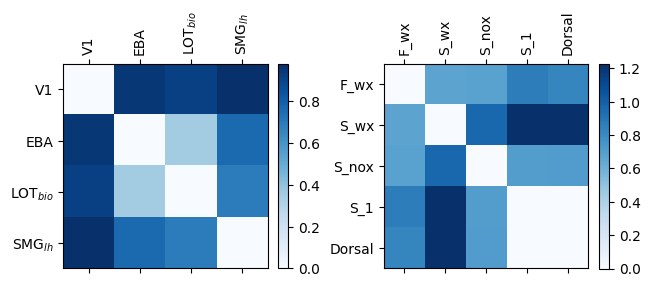

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(6.4, 4.8 * 2), constrained_layout=True)


cax = axes[0].matshow(1 - MRI_RSA, cmap="Blues")
axes[0].set_xticks(np.arange(len(roi)))
axes[0].set_yticks(np.arange(len(roi)))
axes[0].set_xticklabels(roi, rotation=90)
axes[0].set_yticklabels(roi)
fig.colorbar(cax, ax=axes[0], fraction=0.05)


cax = axes[1].matshow(1 - model_RSA, cmap="Blues")
axes[1].set_xticks(np.arange(len(condition)))
axes[1].set_yticks(np.arange(len(condition)))
axes[1].set_xticklabels(condition, rotation=90)
axes[1].set_yticklabels(condition)
fig.colorbar(cax, ax=axes[1], fraction=0.05)
plt.show()

MRI Stress: 1.131356665789605e-14
Model Stress: 0.006169389085978314


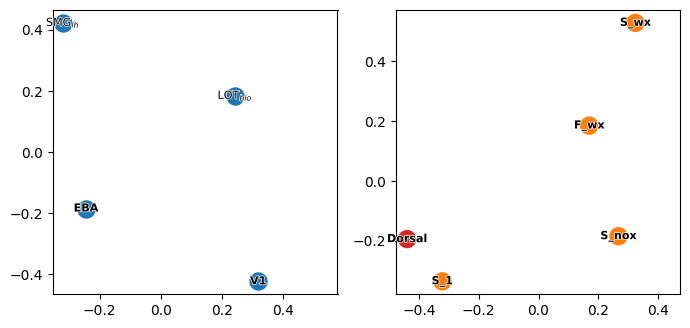

In [ ]:
from sklearn.manifold import MDS

mds = MDS(
    dissimilarity="precomputed",
    n_components=2,
    metric=False,
    random_state=15,
    eps=1e-15,
)
mds_R1 = mds.fit_transform(1 - MRI_RSA)

print(f"MRI Stress: {mds.stress_}")

mds = MDS(
    dissimilarity="precomputed",
    n_components=2,
    metric=False,
    random_state=15,
    eps=1e-15,
)
mds_R = mds.fit_transform(1 - model_RSA)

print(f"Model Stress: {mds.stress_}")

fig, axes = plt.subplots(1, 2, figsize=(7, 7 * 2))

scatter = axes[0].scatter(mds_R1[:, 0], mds_R1[:, 1], s=150, c="tab:blue")

for i, txt in enumerate(roi):
    text = axes[0].text(
        mds_R1[i, 0],
        mds_R1[i, 1],
        txt,
        ha="center",
        va="center",
        fontweight="bold",
        fontsize=8,
    )
    text.set_path_effects(
        [path_effects.Stroke(linewidth=1, foreground="white"), path_effects.Normal()]
    )

# axes[0].xaxis.set_visible(False)
# axes[0].yaxis.set_visible(False)
axes[0].axis("square")

scatter = axes[1].scatter(
    mds_R[:, 0], mds_R[:, 1], s=150, c=["tab:orange"] * 4 + ["tab:red"]
)

for i, txt in enumerate(condition):
    text = axes[1].text(
        mds_R[i, 0],
        mds_R[i, 1],
        txt,
        ha="center",
        va="center",
        fontweight="bold",
        fontsize=8,
    )
    text.set_path_effects(
        [path_effects.Stroke(linewidth=1, foreground="white"), path_effects.Normal()]
    )

# axes[1].xaxis.set_visible(False)
# axes[1].yaxis.set_visible(False)
axes[1].axis("square")

plt.tight_layout()
plt.show()


In [ ]:
model_RDMs1 = np.repeat(model_RDMs[np.newaxis, :, :, :], 15, axis=0)
RDMs = np.concatenate((MRI_RDMs, model_RDMs1), axis=1)
whole_RSA = np.ones((15, len(ROIList) + len(condition), len(ROIList) + len(condition)))
combinations = list(itertools.combinations(range(len(ROIList) + len(condition)), 2))
for s in range(15):
    for c1, c2 in combinations:
        RSA, _ = calculate_RSA(RDMs[s, c1, :, :], RDMs[s, c2, :, :])
        whole_RSA[s, c1, c2] = whole_RSA[s, c2, c1] = RSA

whole_RSA = np.mean(whole_RSA, axis=0)

Stress: 0.16055144766114976


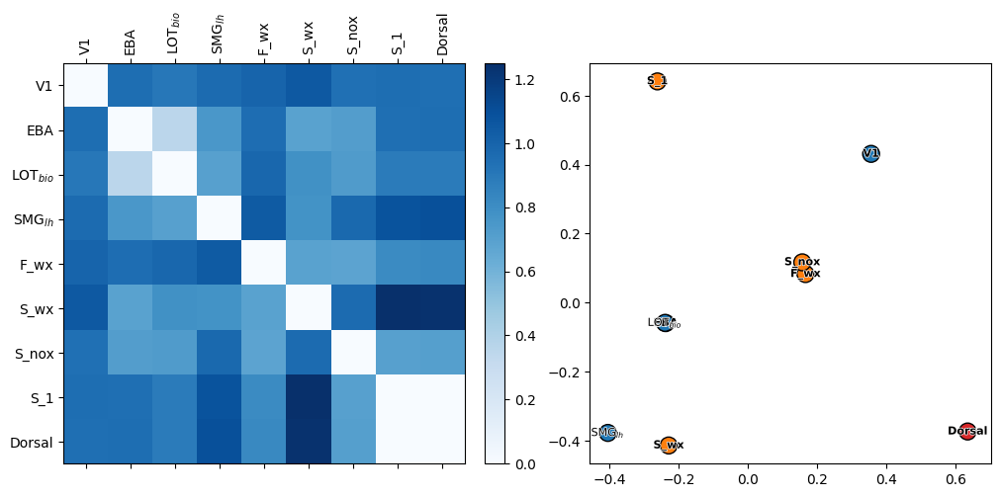

In [ ]:
mds = MDS(
    dissimilarity="precomputed",
    n_components=2,
    metric=False,
    random_state=42,
    eps=1e-15,
)
mds_R = mds.fit_transform(1 - whole_RSA)

print(f"Stress: {mds.stress_}")

# Adjust figure size and remove extra spacing
fig, axes = plt.subplots(1, 2, figsize=(10, 10 * 2), constrained_layout=True)

# First plot (matshow)
cax = axes[0].matshow(1 - whole_RSA, cmap="Blues")
axes[0].set_xticks(np.arange(len(roi + condition)))
axes[0].set_yticks(np.arange(len(roi + condition)))
axes[0].set_xticklabels(roi + condition, rotation=90)
axes[0].set_yticklabels(roi + condition)

# Adjust colorbar padding
fig.colorbar(cax, ax=axes[0], fraction=0.05)

# Second plot (scatter)
colors = ["tab:blue"] * 4 + ["tab:orange"] * 4 + ["tab:red"]
scatter = axes[1].scatter(mds_R[:, 0], mds_R[:, 1], s=150, edgecolors="black", c=colors)

for i, txt in enumerate(roi + condition):
    text = axes[1].text(
        mds_R[i, 0],
        mds_R[i, 1],
        txt,
        ha="center",
        va="center",
        fontweight="bold",
        fontsize=8,
    )
    text.set_path_effects(
        [path_effects.Stroke(linewidth=1, foreground="white"), path_effects.Normal()]
    )

# axes[1].xaxis.set_visible(False)
# axes[1].yaxis.set_visible(False)
axes[1].axis("square")

plt.show()

# CLUSTERING

In [44]:
roi = ["V1", "EBA", "LOT$_{bio}$", "SMG$_{lh}$"]

In [ ]:
import itertools
import pickle
import numpy as np
from compute_RSA import calculate_RSA
import matplotlib.pyplot as plt
from plot_RSA_layers import filter_rsa_data
import matplotlib.patheffects as path_effects

ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]
MRI_RDMs = np.zeros((len(ROIList), 15, 6, 6))

nsub = 0
for sub in range(2, 18):
    if sub == 8:
        continue
    subject = f"S{sub:02d}"

    for r, region in enumerate(ROIList):
        hem = "all"

        if "SMG" in region:
            region, hem = region.split("_")

        RDM_folder = f"result/fMRI RDM/pearson/{region}"

        if region == "behavior":
            with open(f"{RDM_folder}/RDM_dynamic.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)
        else:
            with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)

        MRI_RDMs[r, nsub, :, :] = dynamic_RDM
    nsub += 1

MRI_RSA = np.ones((15, len(ROIList), len(ROIList)))
combinations = list(itertools.combinations(range(len(ROIList)), 2))
for s in range(15):
    for c1, c2 in combinations:
        RSA, _ = calculate_RSA(MRI_RDMs[c1, s, :, :], MRI_RDMs[c2, s, :, :])
        MRI_RSA[s, c1, c2] = MRI_RSA[s, c2, c1] = RSA

Stress: 0.013182274508862403


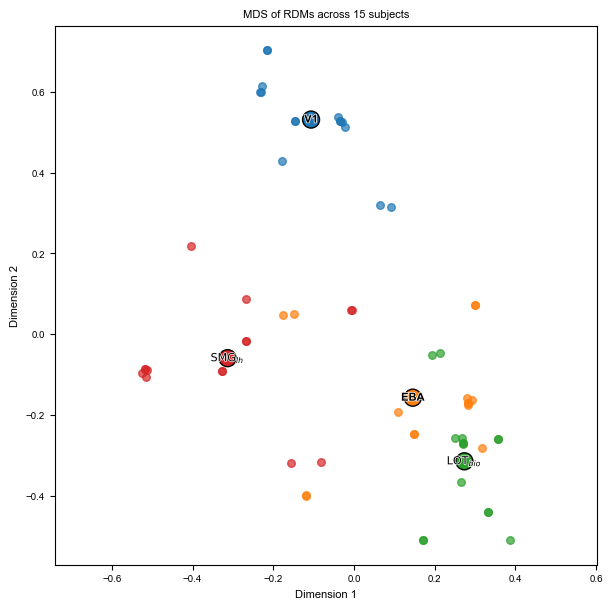

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import MDS
from scipy.spatial import procrustes

RDMs = 1 - MRI_RSA

coords_all = []
for subj in RDMs:
    mds = MDS(
        n_components=2, dissimilarity="precomputed", metric=False, random_state=42
    )
    coords = mds.fit_transform(subj)
    coords_all.append(coords)
coords_all = np.array(coords_all)

ref = coords_all[0]
aligned = []
for coords in coords_all:
    mtx1, mtx2, disparity = procrustes(ref, coords)
    aligned.append(mtx2)
aligned = np.array(aligned)

coords_mean = np.mean(aligned, axis=0)

plt.figure(figsize=(7, 7))

colors = plt.cm.tab10(np.arange(len(roi)))

for subj_coords in aligned:
    for i in range(len(roi)):
        plt.scatter(
            subj_coords[i, 0], subj_coords[i, 1], c=[colors[i]], alpha=0.7, s=30
        )

plt.scatter(coords_mean[:, 0], coords_mean[:, 1], c=colors, s=150, edgecolor="black")

for i, txt in enumerate(roi):
    text = plt.text(
        coords_mean[i, 0],
        coords_mean[i, 1],
        txt,
        ha="center",
        va="center",
        fontweight="bold",
        fontsize=8,
    )
    text.set_path_effects(
        [path_effects.Stroke(linewidth=1, foreground="white"), path_effects.Normal()]
    )

print(f"Stress: {mds.stress_}")
plt.title("MDS of RDMs across 15 subjects")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.axis("equal")
plt.show()

In [ ]:
model_RDMs1 = np.repeat(model_RDMs[np.newaxis, :, :, :], 15, axis=0)
RDMs = np.concatenate((np.transpose(MRI_RDMs, (1, 0, 2, 3)), model_RDMs1), axis=1)
whole_RSA = np.ones((15, len(ROIList) + len(condition), len(ROIList) + len(condition)))
combinations = list(itertools.combinations(range(len(ROIList) + len(condition)), 2))
for s in range(15):
    for c1, c2 in combinations:
        RSA, _ = calculate_RSA(RDMs[s, c1, :, :], RDMs[s, c2, :, :])
        whole_RSA[s, c1, c2] = whole_RSA[s, c2, c1] = RSA

In [ ]:
plt.rcParams.update(
    {
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial"],
        "axes.labelsize": 8,  # Axis labels
        "axes.titlesize": 8,  # Titles
        "xtick.labelsize": 7,  # Tick labels
        "ytick.labelsize": 7,  # Tick labels
        "legend.fontsize": 7,  # Legend text
        "figure.titlesize": 8,  # Suptitle (if used)
        "figure.labelsize": 8,
    }
)

In [ ]:
condition = ["F$_{wx}$", "S$_{wx}$", "S$_{nox}$", "S$_1$", "Dorsal"]

Stress: 0.16886905189456433
Stress: 0.15290249078956694
Stress: 0.13320115334096064
Stress: 0.2090417153101935
Stress: 0.11564123053750298
Stress: 0.1677753135760171
Stress: 0.13824510459543732
Stress: 0.16484110298799903
Stress: 0.11903863406096507
Stress: 0.1501529880094289
Stress: 0.16333971147784376
Stress: 0.16566046970040127
Stress: 0.1226793202879642
Stress: 0.17821059875661208
Stress: 0.16569195876449244


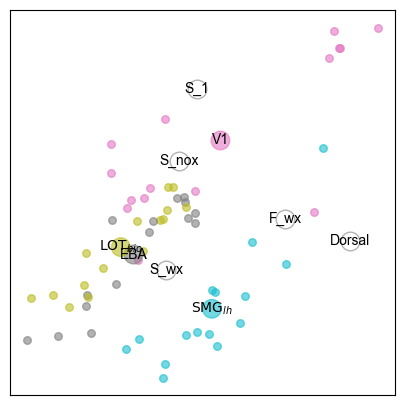

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import MDS
from scipy.spatial import procrustes
import seaborn as sns
import colorcet as cc

RDMs = 1 - whole_RSA

coords_all = []
for subj in RDMs:
    mds = MDS(
        n_components=2, dissimilarity="precomputed", metric=False, random_state=42
    )
    coords = mds.fit_transform(subj)
    coords_all.append(coords)
    print(f"Stress: {mds.stress_}")
coords_all = np.array(coords_all)

ref = coords_all[0]
aligned = []
for coords in coords_all:
    mtx1, mtx2, disparity = procrustes(ref, coords)
    aligned.append(mtx2)
aligned = np.array(aligned)

coords_mean = np.mean(aligned, axis=0)

plt.figure(figsize=(5, 5))

colors = ["tab:pink", "tab:gray", "tab:olive", "tab:cyan"]

for subj_coords in aligned:
    for i in range(len(ROIList + condition)):
        if i < len(ROIList):
            plt.scatter(
                subj_coords[i, 0], subj_coords[i, 1], c=colors[i], s=30, alpha=0.6
            )

plt.scatter(
    coords_mean[: len(ROIList), 0],
    coords_mean[: len(ROIList), 1],
    c=colors[: len(ROIList)],
    s=180,
    alpha=0.6,
)
plt.scatter(
    coords_mean[len(ROIList) :, 0],
    coords_mean[len(ROIList) :, 1],
    c="white",
    s=180,
    alpha=0.3,
    edgecolor="black",
)

for i, txt in enumerate(roi + condition):
    text = plt.text(coords_mean[i, 0], coords_mean[i, 1], txt, ha="center", va="center")
    # text.set_path_effects([path_effects.Stroke(linewidth=1, foreground="white"), path_effects.Normal()])

# plt.title("MDS of RDMs across 15 subjects")
# plt.axis("equal")
# plt.xlim((-0.3, 0.3))
plt.xticks([])
plt.yticks([])
# plt.box(on=False)
plt.gca().set_box_aspect(1)
plt.show()

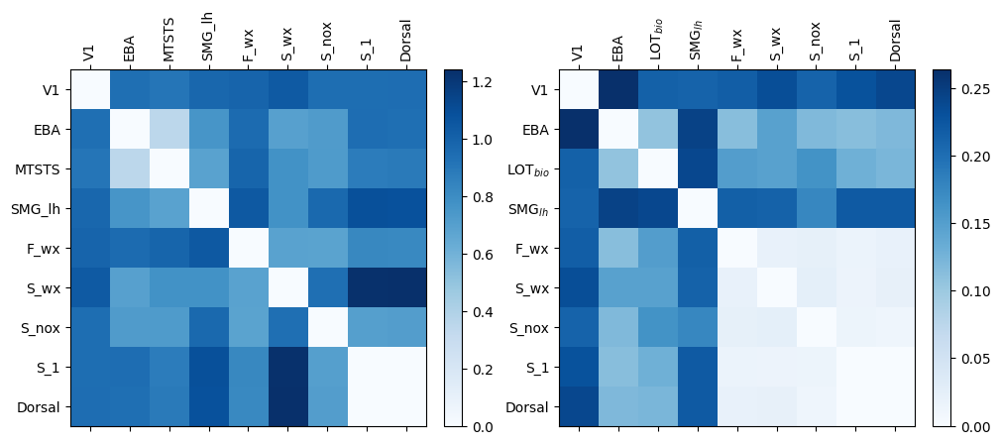

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 10 * 2), constrained_layout=True)

# First plot (matshow)
cax = axes[0].matshow(np.mean(1 - whole_RSA, axis=0), cmap="Blues")
axes[0].set_xticks(np.arange(len(ROIList + condition)))
axes[0].set_yticks(np.arange(len(ROIList + condition)))
axes[0].set_xticklabels(ROIList + condition, rotation=90)
axes[0].set_yticklabels(ROIList + condition)

# Adjust colorbar padding
fig.colorbar(cax, ax=axes[0], fraction=0.05)

cax = axes[1].matshow(np.std(1 - whole_RSA, axis=0), cmap="Blues")
axes[1].set_xticks(np.arange(len(ROIList + condition)))
axes[1].set_yticks(np.arange(len(ROIList + condition)))
axes[1].set_xticklabels(roi + condition, rotation=90)
axes[1].set_yticklabels(roi + condition)
fig.colorbar(cax, ax=axes[1], fraction=0.05)

# axes[1].xaxis.set_visible(False)
# axes[1].yaxis.set_visible(False)

plt.show()

# Next

In [ ]:
condition = ["SF-S", "SF-F", "SF-S-noF", "S-only"]
dataset = ["k400"]

model_RDMs = np.zeros((len(condition), 17, 6, 6))

for c, cond in enumerate(condition):
    if cond in ["SF-S", "SF-F"]:
        model_name = "slowfast_r50"
    elif cond == "SF-S-noF":
        model_name = "slow_r50"
    else:
        model_name = "res_r50"

    model_path = f"result/model RDM/dynamic/pearson_RDM_{model_name}.pkl"
    with open(model_path, "rb") as pickle_file:
        model_RDM = pickle.load(pickle_file)

    filtered_list = filter_rsa_data(model_RDM, cond)
    indices = [i for i, key in enumerate(model_RDM.keys()) if key in filtered_list]

    model_RDM = np.array(list(model_RDM.values()))
    model_RDM = model_RDM[indices, :, :]

    model_RDMs[c, :, :, :] = model_RDM

combinations = list(itertools.combinations(range(len(condition)), 2))
model_RSA = np.zeros((len(combinations), 17, 17))

for c, (c1, c2) in enumerate(combinations):
    for l1 in range(17):
        for l2 in range(17):
            RSA, _ = calculate_RSA(model_RDMs[c1, l1, :, :], model_RDMs[c2, l2, :, :])
            model_RSA[c, l1, l2] = RSA

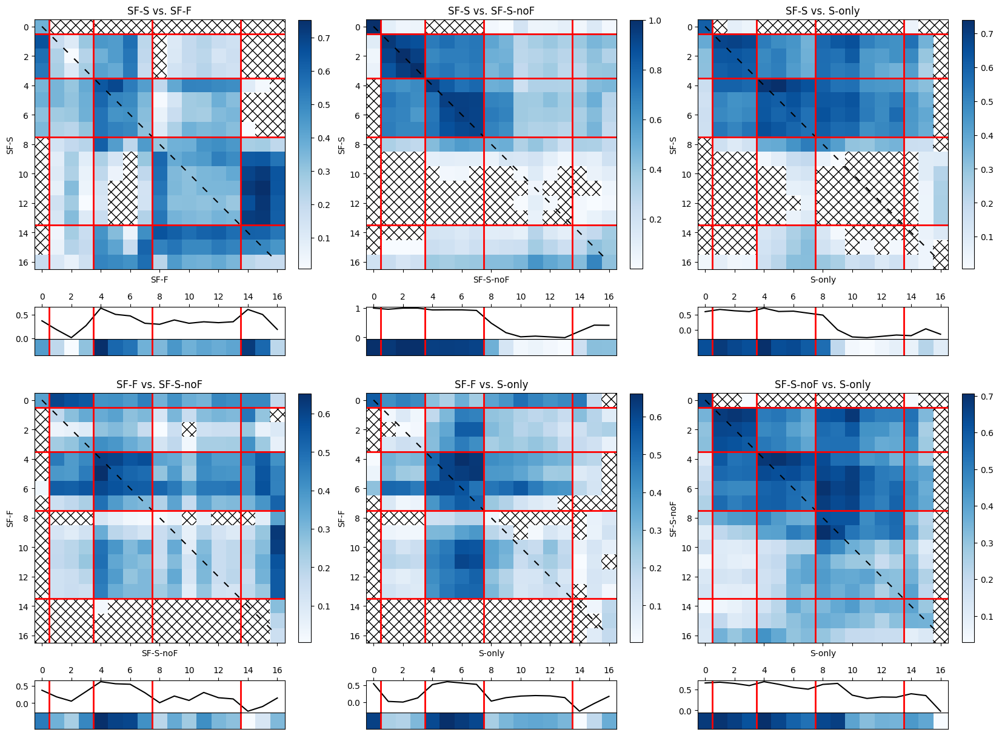

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(6, 3, height_ratios=[10, 1, 0.5, 10, 1, 0.5], hspace=0)
axes_diag = []

for c, (c1, c2) in enumerate(combinations):
    row = (c // 3) * 3
    col = c % 3

    ax = plt.subplot(gs[row, col])

    masked_data = np.ma.masked_less(model_RSA[c, :, :], 0)
    cax = ax.matshow(masked_data, cmap="Blues")

    for i in range(model_RSA[c, :, :].shape[0]):
        for j in range(model_RSA[c, :, :].shape[1]):
            if model_RSA[c, i, j] < 0:
                rect = patches.Rectangle(
                    (j - 0.5, i - 0.5), 1, 1, hatch="xx", fill=False, linewidth=0
                )
                ax.add_patch(rect)

    ax.set_xlabel(condition[c2])
    ax.set_ylabel(condition[c1])
    ax.set_title(f"{condition[c1]} vs. {condition[c2]}")
    fig.colorbar(cax, ax=ax, fraction=0.045)
    size = model_RSA.shape[1]
    ax.plot(range(size), range(size), color="black", ls=(0, (5, 7)))

    ax.xaxis.set_tick_params(labeltop=False, top=False)

    ax2 = plt.subplot(gs[row + 2, col], sharex=ax)
    diag_values = np.diag(model_RSA[c, :, :]).reshape(1, -1)
    im = ax2.imshow(diag_values, cmap="Blues", aspect="auto")
    ax2.xaxis.set_tick_params(labelbottom=False, bottom=False)
    ax2.set_yticks([])

    ax3 = plt.subplot(gs[row + 1, col], sharex=ax)
    ax3.plot(diag_values.T, color="black")

    ax3.xaxis.set_tick_params(labeltop=True, labelbottom=False, top=True, bottom=False)

    for fusion in [1, 4, 8, 14]:
        ax.axhline(y=fusion - 0.5, color="red", linewidth=2)
        ax.axvline(x=fusion - 0.5, color="red", linewidth=2)
        ax2.axvline(x=fusion - 0.5, color="red", linewidth=2)
        ax3.axvline(x=fusion - 0.5, color="red", linewidth=2)

    pos = ax.get_position()
    pos2 = ax2.get_position()
    pos3 = ax3.get_position()
    ax2.set_position([pos.x0, pos2.y0, pos.width, pos2.height])
    ax3.set_position([pos.x0, pos3.y0, pos.width, pos3.height])

plt.show()

In [ ]:
model_path = "result/model RDM/dynamic/pearson_RDM_slowfast_r50.pkl"
with open(model_path, "rb") as pickle_file:
    model_RDM = pickle.load(pickle_file)

slow = [
    i
    for i, key in enumerate(model_RDM.keys())
    if key in filter_rsa_data(model_RDM, "SF-S")
]
fusion = [
    i
    for i, key in enumerate(model_RDM.keys())
    if key in filter_rsa_data(model_RDM, "fusion")
]

indices = np.searchsorted(slow, fusion, side="left")
print(indices)

[ 1  4  8 14]


# MATLAB

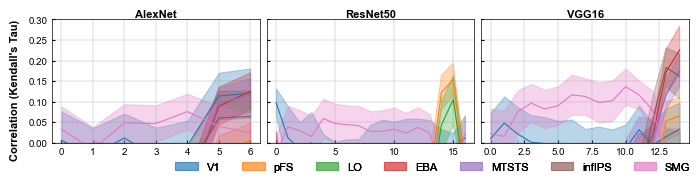

In [ ]:
import matplotlib.pyplot as plt
import pickle
import numpy as np
from scipy import stats
import itertools
from scipy.stats import kendalltau
from mne.stats import permutation_cluster_test

ROIList = ["V1", "pFS", "LO", "EBA", "MTSTS", "infIPS", "SMG"]
status = "static"


def bootstraping(data_A, data_B):
    def my_statistic(data_A, data_B):
        return np.mean(data_A, axis=0) - np.mean(data_B, axis=0)

    T_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
        [data_A, data_B],
        n_permutations=1000,
        tail=0,
        stat_fun=my_statistic,
        out_type="mask",
        threshold=0.1,
        verbose=False,
    )

    significant = np.zeros(T_obs.shape, dtype=bool)
    for i, p_value in enumerate(cluster_p_values):
        if p_value < 0.05:
            significant[clusters[i]] = True

    return significant


def load_rsa_data(region, model_name, data_path, hem):
    folder = f"result/RSA/{data_path}imagenet/{model_name}/pearson/{region}/"
    data = []

    if region == "behavior":
        with open(f"{folder}S02_{status}_RSA.pkl", "rb") as File:
            RSA = pickle.load(File)
        data = [[tup[1] for tup in rsa_dict.values()] for rsa_dict in RSA]
        RSA = RSA[0]
    else:
        for sub in range(2, 18):
            if sub == 8:
                continue
            subject = f"S{sub:02d}"
            with open(f"{folder}{subject}_{hem}_{status}_RSA.pkl", "rb") as File:
                RSA = pickle.load(File)
            data.append([tup[1] for tup in RSA.values()])

    return np.array(data), RSA


def filter_rsa_data(RSA, cond):
    def is_valid_key(key):
        return "act_a" not in key and "act_b" not in key

    if cond in ["SF-S", "SF-S-noF"]:
        return [
            key
            for key in RSA.keys()
            if "multipathway_blocks.0" in key and is_valid_key(key)
        ]
    elif cond == "SF-F":
        return [
            key
            for key in RSA.keys()
            if "multipathway_blocks.1" in key and is_valid_key(key)
        ]
    elif cond == "fusion":
        return [
            key
            for key in RSA.keys()
            if "multipathway_fusion" in key and is_valid_key(key)
        ]

    return [key for key in RSA.keys() if is_valid_key(key)]


def plot_significance(ax, sig, count):
    consecutive_significant_indices = {i: [] for i in range(count + 1)}
    single_significant_indices = {i: [] for i in range(count + 1)}

    for col in range(count + 1):
        significant_indices = np.where(sig[col, :])[0]
        if len(significant_indices) == 1:
            single_significant_indices[col].append(significant_indices[0])
        elif len(significant_indices) == 0:
            continue
        else:
            start = significant_indices[0]
            for i in range(1, len(significant_indices)):
                if significant_indices[i] != significant_indices[i - 1] + 1:
                    if start == significant_indices[i - 1]:
                        single_significant_indices[col].append(start)
                    else:
                        consecutive_significant_indices[col].append(
                            (start, significant_indices[i - 1])
                        )
                    start = significant_indices[i]
            if start == significant_indices[-1]:
                single_significant_indices[col].append(start)
            else:
                consecutive_significant_indices[col].append(
                    (start, significant_indices[-1])
                )

    for col in range(count + 1):
        for start_idx, end_idx in consecutive_significant_indices[col]:
            ax.plot(
                np.arange(start_idx, end_idx + 1),
                np.zeros((end_idx - start_idx + 1)) + col - 0.25,
                color="black",
                lw=1.3,
            )
        for idx in single_significant_indices[col]:
            ax.scatter(
                idx, col - 0.25, color="black", facecolor="black", s=0.5, marker="o"
            )


def compute_noise_ceiling(region, hem):
    if region == "behavior":
        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/S02_RDM_{status}.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        triu_indices = np.triu_indices(dynamic_RDM.shape[1], k=1)
        fmri_data = dynamic_RDM[:, triu_indices[0], triu_indices[1]]
    else:
        fmri_data = []
        for sub in range(2, 18):
            if sub == 8:
                continue
            subject = f"S{sub:02d}"

            RDM_folder = f"result/fMRI RDM/pearson/{region}"
            with open(f"{RDM_folder}/{subject}_RDM_{hem}_{status}.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)

            fmri_data.append(dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)])
        fmri_data = np.array(fmri_data)

    correlations = []
    for i in range(fmri_data.shape[0]):
        mask = np.ones(fmri_data.shape[0], dtype=bool)
        mask[i] = False

        correlation, _ = kendalltau(
            fmri_data[i, :], np.mean(fmri_data[mask, :], axis=0)
        )
        correlations.append(correlation)

    return np.mean(correlations), stats.sem(correlations)


def main(hem, color):
    for datas in dataset:
        fig, axes = plt.subplots(
            int(np.ceil(len(condition) / 3)),
            3,
            figsize=(7, 1.75),
            sharey=True,
        )
        axes = axes.flatten()
        data_path = f"{datas}/" if datas != "k400" else ""

        for c, cond in enumerate(condition):
            if cond in ["SF-S", "SF-F"]:
                model_name = "slowfast_r50"
            elif cond == "SF-S-noF":
                model_name = "slow_r50"
            elif cond == "S-only":
                model_name = "res_r50"
            else:
                model_name = cond

            for r, region in enumerate(ROIList):
                ax = axes[c]
                ax.set_axisbelow(True)
                ax.grid(True, lw=0.3)
                ttest_data = []

                data, RSA = load_rsa_data(region, model_name, data_path, hem)
                filtered_list = filter_rsa_data(RSA, cond)

                indices = [
                    i for i, key in enumerate(RSA.keys()) if key in filtered_list
                ]

                filtered_data = data[:, indices]
                ttest_data.append(filtered_data)
                SEM = stats.sem(filtered_data, axis=0)
                filtered_data = np.mean(filtered_data, axis=0)

                # if cond == condition[0]:
                #     nc_avg, nc_sem = compute_noise_ceiling(region, hem)
                #     ax.fill_between(
                #         range(len(filtered_data)),
                #         nc_avg - nc_sem,
                #         nc_avg + nc_sem,
                #         color="gray",
                #         alpha=0.2,
                #     )
                #     ax.plot(
                #         range(len(filtered_data)),
                #         np.ones((len(filtered_data))) * nc_avg,
                #         color="gray",
                #         lw=1,
                #     )
                #     ax.plot(
                #         range(len(filtered_data)),
                #         np.ones((len(filtered_data))) * (nc_avg - nc_sem),
                #         color="gray",
                #         lw=0.2,
                #     )
                #     ax.plot(
                #         range(len(filtered_data)),
                #         np.ones((len(filtered_data))) * (nc_avg + nc_sem),
                #         color="gray",
                #         lw=0.2,
                #     )

                ax.fill_between(
                    range(len(filtered_data)),
                    filtered_data - SEM,
                    filtered_data + SEM,
                    alpha=0.3,
                    label=f"{region}",
                    color=color[r],
                    lw=0.8,
                )

                ax.plot(filtered_data, label=None, color=color[r], lw=0.8)

            for spine in ax.spines.values():
                spine.set_linewidth(0.5)

            ax.axhline(y=0, color="black", lw=0.8, ls="--")

            ax.set_title(f"{cond}", fontweight="bold", pad=1)
            ax.tick_params(axis="x", direction="in", length=2)
            ax.tick_params(axis="y", direction="in", length=2)

            # for fusion in [1, 4, 8, 14]:
            #     ax.axvline(x=fusion, color="red")

            ax.set_ylim(0, 0.3)
            # ax.set_xlim(0, len(filtered_data) - 1)

            # combinations = list(itertools.combinations(range(len(condition)), 2))
            # sig = np.zeros((len(combinations), len(filtered_data)))
            # for count, ind in enumerate(combinations):
            #     sig[count, :] = bootstraping(ttest_data[ind[0]], ttest_data[ind[1]])
            # plot_significance(ax, sig, count)

            h, l = ax.get_legend_handles_labels()
            fig.legend(
                handles=h,
                labels=l,
                ncols=7,
                loc="lower right",
                frameon=False,
            )

        # fig.suptitle(datas, fontweight="bold")
        fig.supylabel("Correlation (Kendall's Tau)", fontweight="bold")
        plt.tight_layout(pad=0.5)
        # fig.supxlabel("Layers", fontweight="bold")
        fig.subplots_adjust(bottom=0.2, left=0.08)

    plt.savefig(f"plot/{datas}_{hem}_{condition}.png", dpi=300, bbox_inches="tight")


if __name__ == "__main__":
    plt.rcParams.update(
        {
            "font.family": "sans-serif",
            "font.sans-serif": ["Arial"],
            "axes.labelsize": 8,  # Axis labels
            "axes.titlesize": 8,  # Titles
            "xtick.labelsize": 7,  # Tick labels
            "ytick.labelsize": 7,  # Tick labels
            "legend.fontsize": 8,  # Legend text
            "figure.titlesize": 8,  # Suptitle (if used)
            "figure.labelsize": 8,
        }
    )

    dataset = ["k400"]
    hem = "lh"

    # condition = ["SF-S", "SF-F"]
    # color = ["tab:orange", "tab:blue"]

    # condition = ["SF-S-noF", "SF-S"]
    # color = ["tab:green", "tab:orange"]

    condition = ["AlexNet", "ResNet50", "VGG16"]
    color = [
        "tab:blue",
        "tab:orange",
        "tab:green",
        "tab:red",
        "tab:purple",
        "tab:brown",
        "tab:pink",
    ]
    main(hem, color)

# Barplot

/var/folders/n_/6b_9t0zd2wq3t144k58s36_40000gn/T/ipykernel_1343/732921113.py:19: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  T_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


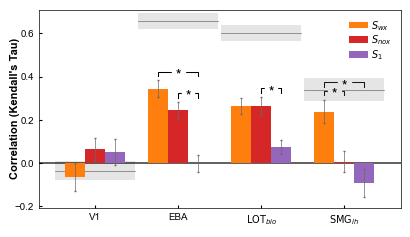

In [ ]:
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import pickle
import numpy as np
from scipy import stats
import os
import itertools
from scipy.stats import kendalltau
from mne.stats import permutation_cluster_test


ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]
status = "dynamic"


def bootstraping(data_A, data_B):
    def my_statistic(data_A, data_B):
        return np.mean(data_A, axis=0) - np.mean(data_B, axis=0)

    T_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
        [data_A, data_B],
        n_permutations=1000,
        tail=0,
        stat_fun=my_statistic,
        out_type="mask",
        threshold=0.1,
        verbose=False,
    )

    significant = np.zeros(T_obs.shape, dtype=bool)
    for i, p_value in enumerate(cluster_p_values):
        if p_value < 0.05:
            significant[clusters[i]] = True

    return significant


def load_rsa_data(region, model_name, data_path, hem):
    folder = f"result/RSA/{data_path}{model_name}/pearson/{region}/"
    data = []

    if region == "behavior":
        with open(f"{folder}S02_{status}_RSA.pkl", "rb") as File:
            RSA = pickle.load(File)
        data = [[tup[1] for tup in rsa_dict.values()] for rsa_dict in RSA]
        RSA = RSA[0]
    else:
        for sub in range(2, 18):
            if sub == 8:
                continue
            subject = f"S{sub:02d}"
            with open(f"{folder}{subject}_{hem}_{status}_RSA.pkl", "rb") as File:
                RSA = pickle.load(File)
            data.append([tup[1] for tup in RSA.values()])

    return np.array(data), RSA


def filter_rsa_data(RSA, cond):
    def is_valid_key(key):
        return "act_a" not in key and "act_b" not in key

    if cond in ["S_wx", "S_nox"]:
        return [
            key
            for key in RSA.keys()
            if "multipathway_blocks.0" in key and is_valid_key(key)
        ]
    elif cond == "F_wx":
        return [
            key
            for key in RSA.keys()
            if "multipathway_blocks.1" in key and is_valid_key(key)
        ]
    elif cond == "fusion":
        return [
            key
            for key in RSA.keys()
            if "multipathway_fusion" in key and is_valid_key(key)
        ]

    return [key for key in RSA.keys() if is_valid_key(key)]


def compute_noise_ceiling(region, hem):
    if region == "behavior":
        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/S02_RDM_{status}.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        triu_indices = np.triu_indices(dynamic_RDM.shape[1], k=1)
        fmri_data = dynamic_RDM[:, triu_indices[0], triu_indices[1]]
    else:
        fmri_data = []
        for sub in range(2, 18):
            if sub == 8:
                continue
            subject = f"S{sub:02d}"

            RDM_folder = f"result/fMRI RDM/pearson/{region}"
            with open(f"{RDM_folder}/{subject}_RDM_{hem}_{status}.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)

            fmri_data.append(dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)])
        fmri_data = np.array(fmri_data)

    correlations = []
    for i in range(fmri_data.shape[0]):
        mask = np.ones(fmri_data.shape[0], dtype=bool)
        mask[i] = False

        correlation, _ = kendalltau(
            fmri_data[i, :], np.mean(fmri_data[mask, :], axis=0)
        )
        correlations.append(correlation)

    return np.mean(correlations), stats.sem(correlations)


def main(hem, color):
    for datas in dataset:
        fig, ax = plt.subplots(
            1,
            1,
            figsize=(4, 2),
            sharey=True,
            sharex=True,
        )
        data_path = f"{datas}/" if datas != "k400" else ""

        br = np.arange(len(ROIList))
        bar = np.zeros(len(condition))
        err = np.zeros(len(condition))
        barWidth = 0.24

        for r, region in enumerate(ROIList):
            ax.set_axisbelow(True)
            ttest_data = []

            if "SMG" in region:
                region, hem = region.split("_")
                ROIList[r] = rf"${{\text{{{region}}}}}_{{{hem}}}$"
            else:
                hem = "all"

            for c, cond in enumerate(condition):
                if cond in ["S_wx", "F_wx"]:
                    model_name = "slowfast_r50"
                elif cond == "S_nox":
                    model_name = "slow_r50"
                else:
                    model_name = "res_r50"

                data, RSA = load_rsa_data(region, model_name, data_path, hem)
                filtered_list = filter_rsa_data(RSA, cond)

                indices = [
                    i for i, key in enumerate(RSA.keys()) if key in filtered_list
                ]

                filtered_data = data[:, indices]
                ttest_data.append(filtered_data)
                SEM = stats.sem(filtered_data[:, 12], axis=0)
                filtered_data = np.mean(filtered_data[:, 12], axis=0)

                bar[c] = filtered_data
                err[c] = SEM

                ax.bar(
                    br[r] + barWidth * c,
                    bar[c],
                    yerr=err[c],
                    color=color[c],
                    label=cond,
                    width=barWidth,
                    capsize=0.75,
                    error_kw={"elinewidth": 0.5, "ecolor": "dimgrey"},
                    zorder=3,
                )

                if cond == condition[0]:
                    nc_avg, nc_sem = compute_noise_ceiling(region, hem)
                    ax.fill_between(
                        [br[r] - barWidth, br[r] + barWidth * 3],
                        nc_avg - nc_sem,
                        nc_avg + nc_sem,
                        color="gray",
                        alpha=0.2,
                        edgecolor="none",
                        zorder=2,
                    )
                    ax.plot(
                        [br[r] - barWidth, br[r] + barWidth * 3],
                        [nc_avg, nc_avg],
                        color="dimgrey",
                        lw=0.5,
                        zorder=0,
                    )

            for spine in ax.spines.values():
                spine.set_linewidth(0.5)

            ax.tick_params(axis="x", direction="in", length=2)
            ax.tick_params(axis="y", direction="in", length=2)
            ax.axhline(y=0, color="black", lw=0.3)

            combinations = list(itertools.combinations(range(len(condition)), 2))
            combinations = sorted(combinations, key=lambda x: abs(x[0] - x[1]))
            y_pre = np.zeros((len(condition)))
            for count, ind in enumerate(combinations):
                significant_layers = bootstraping(
                    ttest_data[ind[0]], ttest_data[ind[1]]
                )
                if significant_layers[12] > 0:
                    x1 = br[r] + barWidth * ind[0]
                    x2 = br[r] + barWidth * ind[1]
                    y1 = bar[ind[0]] + err[ind[0]]
                    y2 = bar[ind[1]] + err[ind[1]]
                    y1 = max(y1, y_pre[ind[0]], y1)
                    y2 = max(y_pre[ind[1]], y2)
                    y_max = max(y1, y2)
                    y = [y_max + 0.02, y_max + 0.04, y_max + 0.04, y_max + 0.02]
                    ax.plot(
                        [x1, x1, x2, x2], y, color="black", linewidth=0.75, zorder=0
                    )
                    ax.add_patch(
                        Rectangle(
                            ((x1 + x2) / 2 - 0.075, y[1] - 0.005),
                            0.15,
                            0.01,
                            color="white",
                            zorder=1,
                        )
                    )
                    ax.text(
                        (x1 + x2) / 2,
                        y[1] - 0.015,
                        "*",
                        ha="center",
                        va="center",
                        zorder=2,
                    )
                    for i in range(ind[0], ind[1] + 1):
                        y_pre[i] = y[1]

                    if region == "MTSTS":
                        ROIList[r] = "${\\text{LOT}}_{bio}$"
    ax.set_xticks(br + barWidth)
    ax.set_xticklabels(ROIList)

    # ax.set_xlim(-0.3, 6.8)
    ax.set_ylim(-0.21, 0.71)

    latex_conditions = [r"$" + item.replace("_", r"_{") + r"}$" for item in condition]

    h, _ = ax.get_legend_handles_labels()
    ax.legend(
        handles=h[: len(condition)],
        labels=latex_conditions,
        ncols=1,
        loc="upper right",
        frameon=False,
        labelspacing=0.1,
        handletextpad=0.3,
    )

    fig.supylabel("Correlation (Kendall's Tau)", fontweight="bold")
    # fig.suptitle("Layer 12", fontweight="bold")
    # fig.supxlabel("Regions", fontweight="bold")
    plt.tight_layout(pad=0.1)
    fig.subplots_adjust(bottom=0)

    plt.savefig(f"plot/barplot_{datas}_{hem}.png", dpi=300, bbox_inches="tight")


if __name__ == "__main__":
    plt.rcParams.update(
        {
            "font.family": "sans-serif",
            "font.sans-serif": ["Arial"],
            "axes.labelsize": 8,  # Axis labels
            "axes.titlesize": 8,  # Titles
            "xtick.labelsize": 7,  # Tick labels
            "ytick.labelsize": 7,  # Tick labels
            "legend.fontsize": 7,  # Legend text
            "figure.titlesize": 8,  # Suptitle (if used)
            "figure.labelsize": 8,
        }
    )

    dataset = ["k400"]
    hem = "all"

    condition = ["S_wx", "S_nox", "S_1"]
    color = ["tab:orange", "tab:red", "tab:purple"]

    main(hem, color)

# Partial Correlation

In [5]:
from scipy import stats
import matplotlib.pyplot as plt
import pickle
import numpy as np
from scipy.stats import rankdata, kendalltau
from plot_RSA_layers import filter_rsa_data as sl_filter
from plot_RSA_layers_dorsalnet import filter_rsa_data as ds_filter


def partial_corr(y, x1, x2, rank_transform=True):
    if rank_transform:
        y = rankdata(y)
        x1 = rankdata(x1)
        x2 = rankdata(x2)

    r_yx1, _ = kendalltau(y, x1)
    r_yx2, _ = kendalltau(y, x2)
    r_x1x2, _ = kendalltau(x1, x2)

    num = r_yx1 - r_yx2 * r_x1x2
    den = np.sqrt((1 - r_yx2**2) * (1 - r_x1x2**2))
    return num / den if den > 0 else 0.0


def compute_noise_ceiling(region, hem):
    status = "dynamic"
    if region == "behavior":
        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/S02_RDM_{status}.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        triu_indices = np.triu_indices(dynamic_RDM.shape[1], k=1)
        fmri_data = dynamic_RDM[:, triu_indices[0], triu_indices[1]]
    else:
        fmri_data = []
        for sub in range(2, 18):
            if sub == 8:
                continue
            subject = f"S{sub:02d}"

            RDM_folder = f"result/fMRI RDM/pearson/{region}"
            with open(f"{RDM_folder}/{subject}_RDM_{hem}_{status}.pkl", "rb") as File:
                dynamic_RDM = pickle.load(File)

            fmri_data.append(dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)])
        fmri_data = np.array(fmri_data)

    correlations = []
    for i in range(fmri_data.shape[0]):
        mask = np.ones(fmri_data.shape[0], dtype=bool)
        mask[i] = False

        correlation, _ = kendalltau(
            fmri_data[i, :], np.mean(fmri_data[mask, :], axis=0)
        )
        correlations.append(correlation)

    return np.mean(correlations), stats.sem(correlations)


ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]

RDM_folder = "result/model RDM/dynamic"
with open(f"{RDM_folder}/pearson_RDM_slowfast_r50.pkl", "rb") as File:
    slowfast_model = pickle.load(File)
slowfast_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in slowfast_model.items()
}

with open(f"{RDM_folder}/pearson_RDM_dorsalnet.pkl", "rb") as File:
    dorsalnet_model = pickle.load(File)
dorsalnet_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in dorsalnet_model.items()
}

filtered_list = sl_filter(slowfast_model, "S_wx")
indices = [i for i, key in enumerate(slowfast_model.keys()) if key in filtered_list]
slowfast_model = np.array(list(slowfast_model.values()))[indices, :]

filtered_list = ds_filter(dorsalnet_model)
indices = [i for i, key in enumerate(dorsalnet_model.keys()) if key in filtered_list]
dorsalnet_model = np.array(list(dorsalnet_model.values()))[indices, :]

data = []
R2 = []
cor = []
data_sem = []
noise_ceiling = []
hemm = "all"
for r, region in enumerate(ROIList):
    if "SMG" in region:
        region, hem = region.split("_")
        ROIList[r] = rf"${{\text{{{region}}}}}_{{{hem}}}$"
    else:
        hem = hemm

    nc_avg, _ = compute_noise_ceiling(region, hem)
    noise_ceiling.append(nc_avg)

    fmri_data = []
    for sub in range(1, 18):
        if sub == 1 or sub == 8:
            continue
        subject = f"S{sub:02d}"

        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        fmri_RDM = dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)]
        fmri_data.append(fmri_RDM)

    if region == "MTSTS":
        ROIList[r] = "${\\text{LOT}}_{bio}$"

    R2_total = np.zeros((len(fmri_data)))
    result = np.zeros((len(fmri_data), 2))
    result_cor = np.zeros((len(fmri_data), 2))
    for f, fmri_RDM in enumerate(fmri_data):
        l1 = slowfast_model[10, :]
        l2 = dorsalnet_model[2, :]
        result[f, 0] = partial_corr(fmri_RDM, l1, l2)
        result[f, 1] = partial_corr(fmri_RDM, l2, l1)

        r_yx1, _ = kendalltau(fmri_RDM, l1)
        r_yx2, _ = kendalltau(fmri_RDM, l2)
        result_cor[f, :] = [r_yx1, r_yx2]
        r_x1x2, _ = kendalltau(l1, l2)
        R2_total[f] = (r_yx1**2 + r_yx2**2 - 2 * r_yx1 * r_yx2 * r_x1x2) / (
            1 - r_x1x2**2
        )

    semm = stats.sem(result, axis=0)
    r = np.mean(result, axis=0)
    result_cor = np.mean(result_cor, axis=0)
    R2_total = np.mean(R2_total)

    data.append(r)
    data_sem.append(semm)
    cor.append(result_cor)
    R2.append(R2_total)

ModuleNotFoundError: No module named 'plot_RSA_layers'

/var/folders/n_/6b_9t0zd2wq3t144k58s36_40000gn/T/ipykernel_60870/1921824738.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


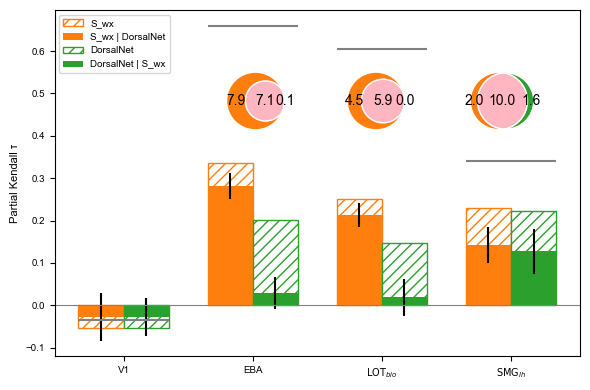

In [ ]:
from matplotlib_venn import venn2, venn2_circles

n_groups = data.shape[0]
n_bars = data.shape[1]

x = np.arange(n_groups)
width = 0.35
bottom1 = np.zeros(n_groups)
bottom2 = np.zeros(n_groups)

fig, ax = plt.subplots(figsize=(6, 4))

color = ["tab:orange", "tab:green"]

ax.bar(
    x - width / 2,
    cor[:, 0],
    width,
    color="white",
    label="S_wx",
    hatch="///",
    linewidth=1,
    edgecolor=color[0],
)
ax.bar(
    x - width / 2,
    data[:, 0],
    width,
    yerr=data_sem[:, 0],
    label="S_wx | DorsalNet",
    color=color[0],
)
ax.bar(
    x + width / 2,
    cor[:, 1],
    width,
    color="white",
    label="DorsalNet",
    hatch="///",
    linewidth=1,
    edgecolor=color[1],
)
ax.bar(
    x + width / 2,
    data[:, 1],
    width,
    yerr=data_sem[:, 1],
    label="DorsalNet | S_wx",
    color=color[1],
)

for i, nc in enumerate(noise_ceiling):
    ax.hlines(nc, i - width, i + width, colors="k", linewidth=1.5, color="gray")

# Formatting
ax.set_xticks(x)
ax.set_xticklabels(roi)
ax.set_ylabel("Partial Kendall τ")
ax.axhline(0, color="gray", linewidth=0.8)
ax.legend(loc="upper left")

unique_sf = data[1, 0] ** 2  # slowfast unique
unique_dn = data[1, 1] ** 2  # dorsalnet unique
R2_total = R2[1]

# shared variance
shared = R2_total - unique_sf - unique_dn
shared = max(shared, 0)  # ensure non-negative

residual = max(1 - R2_total, 0)

total = unique_sf + unique_dn + shared + residual
unique_sf = round(unique_sf / total * 100, 1)
unique_dn = round(unique_dn / total * 100, 1)
shared = round(shared / total * 100, 1)
residual = round(residual / total * 100, 1)

EBA = fig.add_axes([0.35, 0.65, 0.17, 0.17])
v = venn2(
    subsets=(unique_sf, unique_dn, shared, 0),
    alpha=1,
    ax=EBA,
    set_colors=(color[0], color[1]),
)
v.get_patch_by_id("11").set_color("lightpink")
v.get_label_by_id("A").set_text("")
v.get_label_by_id("B").set_text("")

venn2_circles(
    subsets=(unique_sf, unique_dn, shared, 0), linewidth=1, ax=EBA, color="white"
)


unique_sf = data[2, 0] ** 2  # slowfast unique
unique_dn = data[2, 1] ** 2  # dorsalnet unique
R2_total = R2[2]

# shared variance
shared = R2_total - unique_sf - unique_dn
shared = max(shared, 0)  # ensure non-negative

residual = max(1 - R2_total, 0)

total = unique_sf + unique_dn + shared + residual
unique_sf = round(unique_sf / total * 100, 1)
unique_dn = round(unique_dn / total * 100, 1)
shared = round(shared / total * 100, 1)
residual = round(residual / total * 100, 1)

LOT = fig.add_axes([0.55, 0.65, 0.17, 0.17])
v = venn2(
    subsets=(
        unique_sf,
        unique_dn,
        shared,
        0,
    ),
    alpha=1,
    ax=LOT,
    set_colors=(color[0], color[1]),
)
v.get_patch_by_id("11").set_color("lightpink")
v.get_label_by_id("A").set_text("")
v.get_label_by_id("B").set_text("")

venn2_circles(
    subsets=(
        unique_sf,
        unique_dn,
        shared,
        0,
    ),
    linewidth=1,
    ax=LOT,
    color="white",
)

unique_sf = data[3, 0] ** 2  # slowfast unique
unique_dn = data[3, 1] ** 2  # dorsalnet unique
R2_total = R2[3]

# shared variance
shared = R2_total - unique_sf - unique_dn
shared = max(shared, 0)  # ensure non-negative

residual = max(1 - R2_total, 0)

total = unique_sf + unique_dn + shared + residual
unique_sf = round(unique_sf / total * 100, 1)
unique_dn = round(unique_dn / total * 100, 1)
shared = round(shared / total * 100, 1)
residual = round(residual / total * 100, 1)

SMG = fig.add_axes([0.76, 0.65, 0.17, 0.17])
v = venn2(
    subsets=(unique_sf, unique_dn, shared, 0),
    alpha=1,
    ax=SMG,
    set_colors=(color[0], color[1]),
)
v.get_patch_by_id("11").set_color("lightpink")
v.get_label_by_id("A").set_text("")
v.get_label_by_id("B").set_text("")

venn2_circles(
    subsets=(unique_sf, unique_dn, shared, 0), linewidth=1, ax=SMG, color="white"
)

plt.tight_layout()
plt.show()

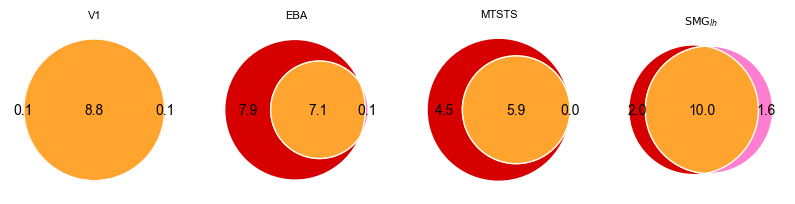

In [ ]:
from matplotlib_venn import venn2, venn2_circles
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(10, 10))
for r in range(len(ROIList)):
    if ROIList[r] == "${\\text{LOT}}_{bio}$":
        ROIList[r] = "MTSTS"
    unique_sf = data[r, 0] ** 2  # slowfast unique
    unique_dn = data[r, 1] ** 2  # dorsalnet unique
    R2_total = R2[r]

    # shared variance
    shared = R2_total - unique_sf - unique_dn
    shared = max(shared, 0)  # ensure non-negative

    residual = max(1 - R2_total, 0)

    total = unique_sf + unique_dn + shared + residual
    unique_sf = round(unique_sf / total * 100, 1)
    unique_dn = round(unique_dn / total * 100, 1)
    shared = round(shared / total * 100, 1)
    residual = round(residual / total * 100, 1)

    color = sns.color_palette(cc.glasbey, n_colors=8)

    v = venn2(
        subsets=(
            unique_sf,
            unique_dn,
            shared,
            0,
        ),
        # set_labels = ("S_wx", "DorsalNet", "fMRI"),
        alpha=1,
        ax=ax[r],
        set_colors=(color[0], color[5]),
    )

    # ax[r].text(1.2, 0.4, f"Residual\n{residual}%", fontsize=12,
    #          ha="center", va="center",
    #          bbox=dict(boxstyle="round,pad=0.4", fc="lightgrey", ec="black"))

    v.get_patch_by_id("11").set_color(color[-1])
    v.get_label_by_id("A").set_text("")
    v.get_label_by_id("B").set_text("")
    # v.get_label_by_id("C").set_text("")

    venn2_circles(
        subsets=(
            unique_sf,
            unique_dn,
            shared,
            0,
        ),
        linewidth=1,
        ax=ax[r],
        color="white",
    )

    ax[r].set_title(f"{ROIList[r]}")
plt.show()

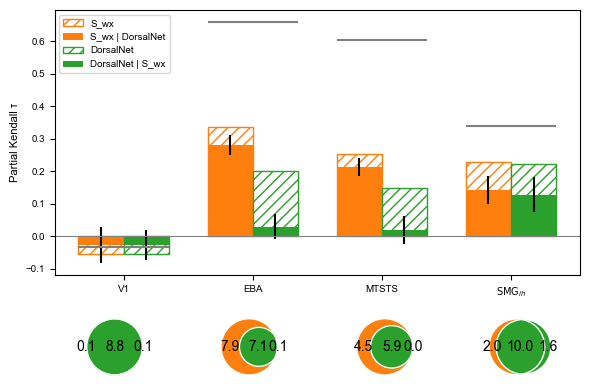

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib_venn import venn2, venn2_circles
import seaborn as sns
import numpy as np

# --- barplot first ---
fig = plt.figure(figsize=(6, 4))
gs = gridspec.GridSpec(
    2, len(ROIList), height_ratios=[1, 0.25]
)  # top: bars, bottom: venns

# Barplot spans all columns
ax_bar = fig.add_subplot(gs[0, :])

color = ["tab:orange", "tab:green"]

x = np.arange(len(ROIList))
width = 0.35

ax_bar.bar(
    x - width / 2,
    cor[:, 0],
    width,
    color="white",
    label="S_wx",
    hatch="///",
    linewidth=1,
    edgecolor=color[0],
)
ax_bar.bar(
    x - width / 2,
    data[:, 0],
    width,
    yerr=data_sem[:, 0],
    label="S_wx | DorsalNet",
    color=color[0],
)
ax_bar.bar(
    x + width / 2,
    cor[:, 1],
    width,
    color="white",
    label="DorsalNet",
    hatch="///",
    linewidth=1,
    edgecolor=color[1],
)
ax_bar.bar(
    x + width / 2,
    data[:, 1],
    width,
    yerr=data_sem[:, 1],
    label="DorsalNet | S_wx",
    color=color[1],
)

for i, nc in enumerate(noise_ceiling):
    ax_bar.hlines(nc, i - width, i + width, colors="gray", linewidth=1.5)

ax_bar.set_xticks(x)
ax_bar.set_xticklabels(ROIList)
ax_bar.set_ylabel("Partial Kendall τ")
ax_bar.legend(loc="upper left")
ax_bar.axhline(0, color="gray", linewidth=0.8)

# --- venn diagrams for each ROI ---
for r in range(len(ROIList)):
    ax_v = fig.add_subplot(gs[1, r])

    # variance partitioning
    unique_sf = data[r, 0] ** 2
    unique_dn = data[r, 1] ** 2
    R2_total = R2[r]
    shared = max(R2_total - unique_sf - unique_dn, 0)
    residual = max(1 - R2_total, 0)

    total = unique_sf + unique_dn + shared + residual
    unique_sf = round(unique_sf / total * 100, 1)
    unique_dn = round(unique_dn / total * 100, 1)
    shared = round(shared / total * 100, 1)
    residual = round(residual / total * 100, 1)

    v = venn2(
        subsets=(unique_sf, unique_dn, shared),
        ax=ax_v,
        set_colors=(color[0], color[1]),
        alpha=1,
    )
    v.get_patch_by_id("11").set_color(colors[2])  # shared region
    v.get_label_by_id("A").set_text("")
    v.get_label_by_id("B").set_text("")
    venn2_circles(
        subsets=(unique_sf, unique_dn, shared), linewidth=1, ax=ax_v, color="white"
    )

    # ax_v.set_title(ROIList[r], fontsize=10)

plt.tight_layout()
plt.show()

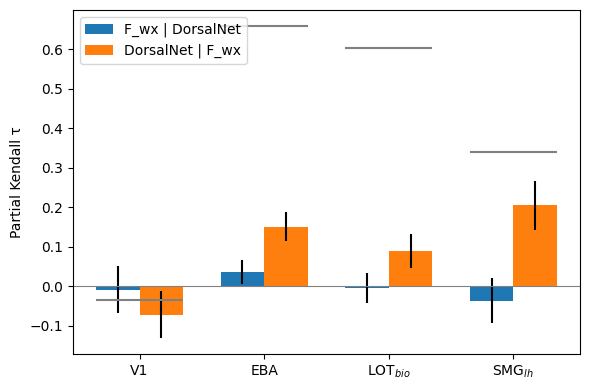

In [ ]:
ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]

RDM_folder = "result/model RDM/dynamic"
with open(f"{RDM_folder}/pearson_RDM_slowfast_r50.pkl", "rb") as File:
    slowfast_model = pickle.load(File)
slowfast_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in slowfast_model.items()
}

with open(f"{RDM_folder}/pearson_RDM_dorsalnet.pkl", "rb") as File:
    dorsalnet_model = pickle.load(File)
dorsalnet_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in dorsalnet_model.items()
}

filtered_list = sl_filter(slowfast_model, "F_wx")
indices = [i for i, key in enumerate(slowfast_model.keys()) if key in filtered_list]
slowfast_model = np.array(list(slowfast_model.values()))[indices, :]

filtered_list = ds_filter(dorsalnet_model)
indices = [i for i, key in enumerate(dorsalnet_model.keys()) if key in filtered_list]
dorsalnet_model = np.array(list(dorsalnet_model.values()))[indices, :]

data = []
data_sem = []
noise_ceiling = []
hemm = "all"
for r, region in enumerate(ROIList):
    if "SMG" in region:
        region, hem = region.split("_")
        ROIList[r] = rf"${{\text{{{region}}}}}_{{{hem}}}$"
    else:
        hem = hemm

    nc_avg, _ = compute_noise_ceiling(region, hem)
    noise_ceiling.append(nc_avg)

    fmri_data = []
    for sub in range(1, 18):
        if sub == 1 or sub == 8:
            continue
        subject = f"S{sub:02d}"

        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        fmri_RDM = dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)]
        fmri_data.append(fmri_RDM)

    if region == "MTSTS":
        ROIList[r] = "${\\text{LOT}}_{bio}$"

    result = np.zeros(
        (len(fmri_data), slowfast_model.shape[0], dorsalnet_model.shape[0], 2)
    )
    for f, fmri_RDM in enumerate(fmri_data):
        for i, l1 in enumerate(slowfast_model):
            for j, l2 in enumerate(dorsalnet_model):
                result[f, i, j, 0] = partial_corr(fmri_RDM, l1, l2)
                result[f, i, j, 1] = partial_corr(fmri_RDM, l2, l1)

    semm = stats.sem(result, axis=0)
    r = np.mean(result, axis=0)

    data.append(r[10, 10, :])
    data_sem.append(semm[10, 10, :])

data = np.array(data)
data_sem = np.array(data_sem)

n_groups = data.shape[0]
n_bars = data.shape[1]

x = np.arange(n_groups)
width = 0.35

fig, ax = plt.subplots(figsize=(6, 4))

# Plot the two bars per group
ax.bar(
    x - width / 2,
    data[:, 0],
    width,
    yerr=data_sem[:, 0],
    label="F_wx | DorsalNet",
    color="tab:blue",
)
ax.bar(
    x + width / 2,
    data[:, 1],
    width,
    yerr=data_sem[:, 1],
    label="DorsalNet | F_wx",
    color="tab:orange",
)

for i, nc in enumerate(noise_ceiling):
    ax.hlines(nc, i - width, i + width, colors="k", linewidth=1.5, color="gray")

# Formatting
ax.set_xticks(x)
ax.set_xticklabels(ROIList)
ax.set_ylabel("Partial Kendall τ")
ax.legend(loc="upper left")
ax.axhline(0, color="gray", linewidth=0.8)

plt.tight_layout()
plt.show()

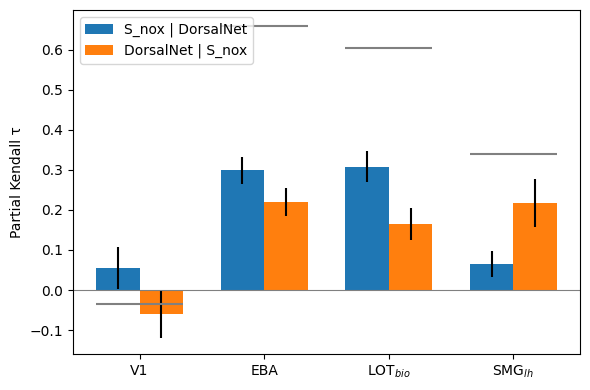

In [ ]:
ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]

RDM_folder = "result/model RDM/dynamic"
with open(f"{RDM_folder}/pearson_RDM_slow_r50.pkl", "rb") as File:
    slowfast_model = pickle.load(File)
slowfast_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in slowfast_model.items()
}

with open(f"{RDM_folder}/pearson_RDM_dorsalnet.pkl", "rb") as File:
    dorsalnet_model = pickle.load(File)
dorsalnet_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in dorsalnet_model.items()
}

filtered_list = sl_filter(slowfast_model, "S_nox")
indices = [i for i, key in enumerate(slowfast_model.keys()) if key in filtered_list]
slowfast_model = np.array(list(slowfast_model.values()))[indices, :]

filtered_list = ds_filter(dorsalnet_model)
indices = [i for i, key in enumerate(dorsalnet_model.keys()) if key in filtered_list]
dorsalnet_model = np.array(list(dorsalnet_model.values()))[indices, :]

data = []
data_sem = []
noise_ceiling = []
hemm = "all"
for r, region in enumerate(ROIList):
    if "SMG" in region:
        region, hem = region.split("_")
        ROIList[r] = rf"${{\text{{{region}}}}}_{{{hem}}}$"
    else:
        hem = hemm

    nc_avg, _ = compute_noise_ceiling(region, hem)
    noise_ceiling.append(nc_avg)

    fmri_data = []
    for sub in range(1, 18):
        if sub == 1 or sub == 8:
            continue
        subject = f"S{sub:02d}"

        RDM_folder = f"result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        fmri_RDM = dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)]
        fmri_data.append(fmri_RDM)

    if region == "MTSTS":
        ROIList[r] = "${\\text{LOT}}_{bio}$"

    result = np.zeros(
        (len(fmri_data), slowfast_model.shape[0], dorsalnet_model.shape[0], 2)
    )
    for f, fmri_RDM in enumerate(fmri_data):
        for i, l1 in enumerate(slowfast_model):
            for j, l2 in enumerate(dorsalnet_model):
                result[f, i, j, 0] = partial_corr(fmri_RDM, l1, l2)
                result[f, i, j, 1] = partial_corr(fmri_RDM, l2, l1)

    semm = stats.sem(result, axis=0)
    r = np.mean(result, axis=0)

    data.append(r[10, 10, :])
    data_sem.append(semm[10, 10, :])

data = np.array(data)
data_sem = np.array(data_sem)

n_groups = data.shape[0]
n_bars = data.shape[1]

x = np.arange(n_groups)
width = 0.35

fig, ax = plt.subplots(figsize=(6, 4))

# Plot the two bars per group
ax.bar(
    x - width / 2,
    data[:, 0],
    width,
    yerr=data_sem[:, 0],
    label="S_nox | DorsalNet",
    color="tab:blue",
)
ax.bar(
    x + width / 2,
    data[:, 1],
    width,
    yerr=data_sem[:, 1],
    label="DorsalNet | S_nox",
    color="tab:orange",
)

for i, nc in enumerate(noise_ceiling):
    ax.hlines(nc, i - width, i + width, colors="k", linewidth=1.5, color="gray")

# Formatting
ax.set_xticks(x)
ax.set_xticklabels(ROIList)
ax.set_ylabel("Partial Kendall τ")
ax.legend(loc="upper left")
ax.axhline(0, color="gray", linewidth=0.8)

plt.tight_layout()
plt.show()

In [4]:
ROIList = ["V1", "EBA", "MTSTS", "SMG_lh"]

RDM_folder = "../../result/model RDM/dynamic"
with open(f"{RDM_folder}/pearson_RDM_res_r50.pkl", "rb") as File:
    slowfast_model = pickle.load(File)
slowfast_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in slowfast_model.items()
}

with open(f"{RDM_folder}/pearson_RDM_dorsalnet.pkl", "rb") as File:
    dorsalnet_model = pickle.load(File)
dorsalnet_model = {
    k: v[np.triu_indices(v.shape[0], k=1)] for k, v in dorsalnet_model.items()
}

filtered_list = sl_filter(slowfast_model, "S_1")
indices = [i for i, key in enumerate(slowfast_model.keys()) if key in filtered_list]
slowfast_model = np.array(list(slowfast_model.values()))[indices, :]

filtered_list = ds_filter(dorsalnet_model)
indices = [i for i, key in enumerate(dorsalnet_model.keys()) if key in filtered_list]
dorsalnet_model = np.array(list(dorsalnet_model.values()))[indices, :]

data = []
data_sem = []
noise_ceiling = []
hemm = "all"
for r, region in enumerate(ROIList):
    if "SMG" in region:
        region, hem = region.split("_")
        ROIList[r] = rf"${{\text{{{region}}}}}_{{{hem}}}$"
    else:
        hem = hemm

    nc_avg, _ = compute_noise_ceiling(region, hem)
    noise_ceiling.append(nc_avg)

    fmri_data = []
    for sub in range(1, 18):
        if sub == 1 or sub == 8:
            continue
        subject = f"S{sub:02d}"

        RDM_folder = f"../../result/fMRI RDM/pearson/{region}"
        with open(f"{RDM_folder}/{subject}_RDM_{hem}_dynamic.pkl", "rb") as File:
            dynamic_RDM = pickle.load(File)

        fmri_RDM = dynamic_RDM[np.triu_indices(dynamic_RDM.shape[0], k=1)]
        fmri_data.append(fmri_RDM)

    if region == "MTSTS":
        ROIList[r] = "${\\text{LOT}}_{bio}$"

    result = np.zeros(
        (len(fmri_data), slowfast_model.shape[0], dorsalnet_model.shape[0], 2)
    )
    for f, fmri_RDM in enumerate(fmri_data):
        for i, l1 in enumerate(slowfast_model):
            for j, l2 in enumerate(dorsalnet_model):
                result[f, i, j, 0] = partial_corr(fmri_RDM, l1, l2)
                result[f, i, j, 1] = partial_corr(fmri_RDM, l2, l1)

    semm = stats.sem(result, axis=0)
    r = np.mean(result, axis=0)

    data.append(r[10, 10, :])
    data_sem.append(semm[10, 10, :])

data = np.array(data)
data_sem = np.array(data_sem)

n_groups = data.shape[0]
n_bars = data.shape[1]

x = np.arange(n_groups)
width = 0.35

fig, ax = plt.subplots(figsize=(6, 4))

# Plot the two bars per group
ax.bar(
    x - width / 2,
    data[:, 0],
    width,
    yerr=data_sem[:, 0],
    label="S_1 | DorsalNet",
    color="tab:blue",
)
ax.bar(
    x + width / 2,
    data[:, 1],
    width,
    yerr=data_sem[:, 1],
    label="DorsalNet | S_1",
    color="tab:orange",
)

for i, nc in enumerate(noise_ceiling):
    ax.hlines(nc, i - width, i + width, colors="k", linewidth=1.5, color="gray")

# Formatting
ax.set_xticks(x)
ax.set_xticklabels(ROIList)
ax.set_ylabel("Partial Kendall τ")
ax.legend(loc="upper left")
ax.axhline(0, color="gray", linewidth=0.8)

plt.tight_layout()
plt.show()

NameError: name 'sl_filter' is not defined

# Nibabel

In [1]:
import numpy as np
import nibabel as nib
import scipy

subj_list = ["S17"]
nruns_all = [12]
roi_list = ["V1", "MTSTS", "SMG"]
analysis = "maintask_perrun"

for i, cur_subj in enumerate(subj_list):
    brik_file = f"../../stats.{cur_subj}.{analysis}_REML+tlrc.HEAD"

    try:
        afni_img = nib.load(brik_file)
        subj_data = afni_img.get_fdata()
        info = afni_img.header.info
    except Exception as e:
        print(f"Error loading {brik_file}: {e}")
        continue

    nruns = nruns_all[i]
    ncond = 12

    condlist = np.array(
        [
            [
                ((i_cond - 1) * (2 * nruns) + np.arange(1, 2 * nruns, 2) + 1 * i_cond)
                + 1
                for i_cond in range(1, ncond + 1)
            ]
        ]
    )

    dyn_condlist = []
    stat_condlist = []

    for row in range(condlist.shape[1]):
        if row % 2 == 0:  # Even index -> dynamic
            dyn_condlist.append(condlist[:, row])
        else:  # Odd index -> static
            stat_condlist.append(condlist[:, row])

    dyn_condlist = np.array(dyn_condlist)
    stat_condlist = np.array(stat_condlist)
    new_condlist = np.squeeze(np.vstack((dyn_condlist, stat_condlist))) - 1

    mask = np.zeros((54, 64, 50))
    for r, roi in enumerate(roi_list):
        cond_data_all = subj_data[:, :, :, new_condlist]

        data = scipy.io.loadmat(f"../../fMRI/S17/GCSS_noOverlap_{roi}_all.mat")[
            "condDataAll"
        ]
        for k in range(data.shape[2]):
            indices = np.where(np.all(cond_data_all == data[:, :, k], axis=(3, 4)))
            if mask[indices] == 0:
                mask[indices] = r + 1
            else:
                print(indices)

In [2]:
new_image = nib.Nifti1Image(mask, affine=afni_img.affine, header=afni_img.header)

In [3]:
from nilearn.datasets import load_fsaverage, load_fsaverage_data
from nilearn.surface import SurfaceImage
from nilearn.plotting import plot_surf_roi

big_fsaverage_meshes = load_fsaverage(mesh="fsaverage")

big_fsaverage_sulcal = load_fsaverage_data(
    mesh="fsaverage",
    data_type="sulcal",
    mesh_type="inflated",
)

big_img = SurfaceImage.from_volume(
    mesh=big_fsaverage_meshes["pial"],
    n_samples=1,
    radius=1.0,
    interpolation="nearest",
    volume_img=new_image,
)


[get_dataset_dir] Dataset found in /Users/nastaran/nilearn_data/fsaverage
[get_dataset_dir] Dataset found in /Users/nastaran/nilearn_data/fsaverage
[get_dataset_dir] Dataset found in /Users/nastaran/nilearn_data/fsaverage


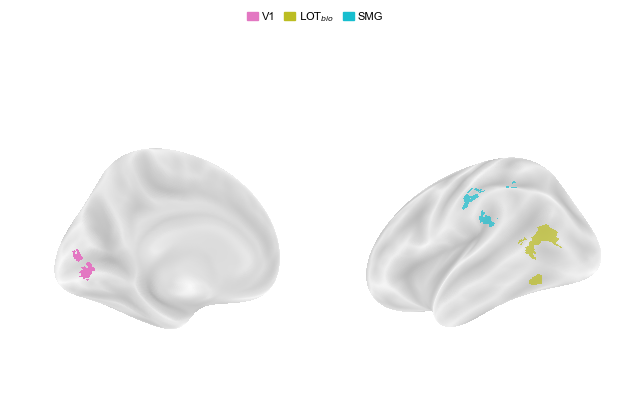

In [4]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "../..")))

from utils.util import init_plot

init_plot()

colors = ["black", "tab:pink", "tab:olive", "tab:cyan"]
custom_cmap = ListedColormap(colors)


big_fsaverage_sulcal.data.parts["left"][-1] = 20


fig, ax = plt.subplots(1, 2, subplot_kw={"projection": "3d"})
plot_surf_roi(
    roi_map=big_img,
    surf_mesh=big_fsaverage_meshes["inflated"],
    bg_map=big_fsaverage_sulcal,
    cmap=custom_cmap,
    view=(0, 330),
    axes=ax[0],
    figure=fig,
)

plot_surf_roi(
    roi_map=big_img,
    surf_mesh=big_fsaverage_meshes["inflated"],
    bg_map=big_fsaverage_sulcal,
    bg_on_data=True,
    cmap=custom_cmap,
    view=(345, 200),
    axes=ax[1],
    figure=fig,
)

roi_list = ["V1", "${\\text{LOT}}_{bio}$", "SMG"]
# # Create custom legend handles using patches
legend_patches = [
    mpatches.Patch(color=custom_cmap(l + 1), label=label)
    for l, label in enumerate(roi_list)
]

# # Manually add the legend
fig.legend(
    handles=legend_patches,
    frameon=False,
    ncols=4,
    columnspacing=0.8,
    handletextpad=0.3,
    handlelength=1,
    loc="upper center",
)

plt.tight_layout()
plt.savefig("regions.png", dpi=300, bbox_inches="tight")

In [6]:
from nilearn.plotting import view_surf

big_fsaverage_sulcal.data.parts["left"][-1] = 3

view = view_surf(
    surf_mesh=big_fsaverage_meshes["inflated"],
    surf_map=big_img,
    symmetric_cmap=False,
    bg_map=big_fsaverage_sulcal,
    cmap=custom_cmap,
    threshold=0.1,
)

# In a Jupyter notebook, if ``view`` is the output of a cell,
# it will be displayed below the cell
view

# uncomment this to open the plot in a web browser:
# view.open_in_browser()

/var/folders/n_/6b_9t0zd2wq3t144k58s36_40000gn/T/ipykernel_48677/2557141491.py:5: RuntimeWarning: Meshes are not identical but have compatible number of vertices.
  view = view_surf(


# classifier

/var/folders/n_/6b_9t0zd2wq3t144k58s36_40000gn/T/ipykernel_97355/2602356449.py:103: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  features, labels = torch.load("cached_featu


Outer Fold 1
    Inner Fold 1 Best Val Acc: 66.00%
    Inner Fold 2 Best Val Acc: 44.00%
    Inner Fold 3 Best Val Acc: 54.00%
    Inner Fold 4 Best Val Acc: 48.00%
    Inner Fold 5 Best Val Acc: 46.00%
    Inner Fold 6 Best Val Acc: 42.00%

Outer Fold 1 Test Accuracy: 50.00%


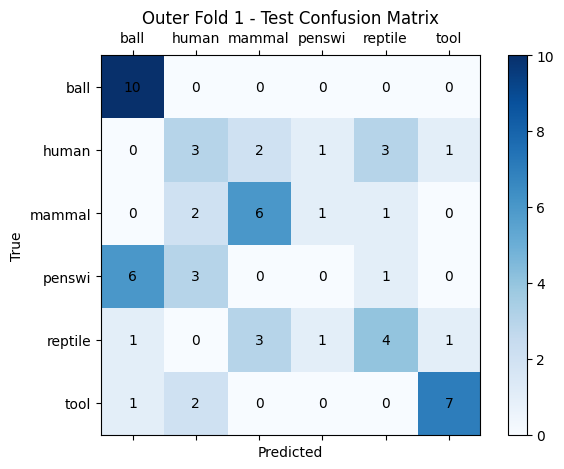


Outer Fold 2
    Inner Fold 1 Best Val Acc: 48.00%
    Inner Fold 2 Best Val Acc: 52.00%
    Inner Fold 3 Best Val Acc: 52.00%
    Inner Fold 4 Best Val Acc: 52.00%
    Inner Fold 5 Best Val Acc: 48.00%
    Inner Fold 6 Best Val Acc: 42.00%

Outer Fold 2 Test Accuracy: 50.00%


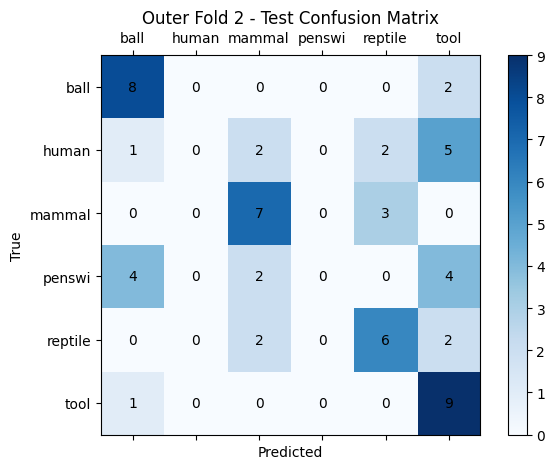


Outer Fold 3
    Inner Fold 1 Best Val Acc: 44.00%
    Inner Fold 2 Best Val Acc: 52.00%
    Inner Fold 3 Best Val Acc: 58.00%
    Inner Fold 4 Best Val Acc: 50.00%
    Inner Fold 5 Best Val Acc: 58.00%
    Inner Fold 6 Best Val Acc: 46.00%

Outer Fold 3 Test Accuracy: 41.67%


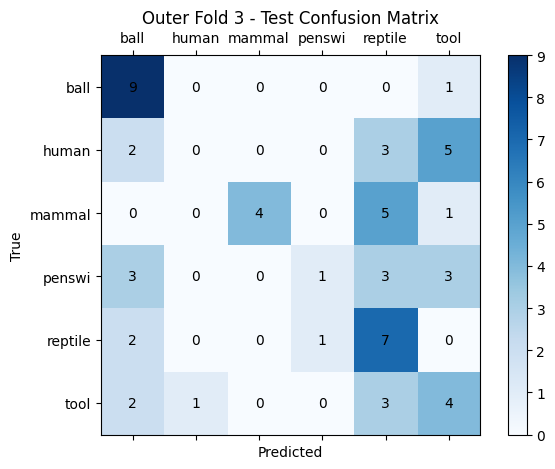


Outer Fold 4
    Inner Fold 1 Best Val Acc: 62.00%
    Inner Fold 2 Best Val Acc: 44.00%
    Inner Fold 3 Best Val Acc: 48.00%
    Inner Fold 4 Best Val Acc: 44.00%
    Inner Fold 5 Best Val Acc: 52.00%
    Inner Fold 6 Best Val Acc: 52.00%

Outer Fold 4 Test Accuracy: 43.33%


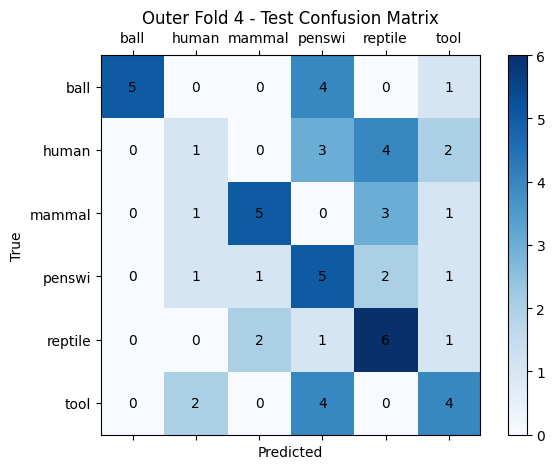


Outer Fold 5
    Inner Fold 1 Best Val Acc: 54.00%
    Inner Fold 2 Best Val Acc: 52.00%
    Inner Fold 3 Best Val Acc: 42.00%
    Inner Fold 4 Best Val Acc: 50.00%
    Inner Fold 5 Best Val Acc: 44.00%
    Inner Fold 6 Best Val Acc: 50.00%

Outer Fold 5 Test Accuracy: 40.00%


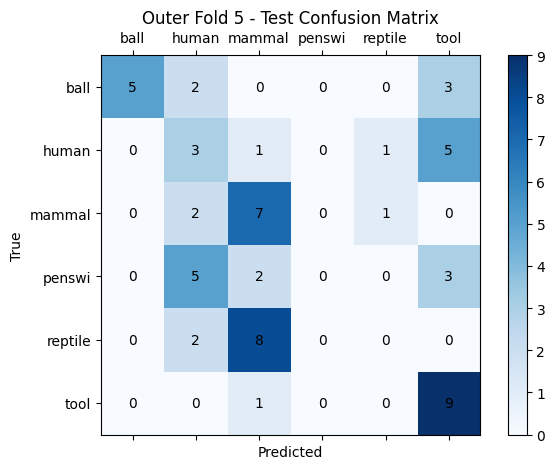


Outer Fold 6
    Inner Fold 1 Best Val Acc: 38.00%
    Inner Fold 2 Best Val Acc: 58.00%
    Inner Fold 3 Best Val Acc: 52.00%
    Inner Fold 4 Best Val Acc: 50.00%
    Inner Fold 5 Best Val Acc: 50.00%
    Inner Fold 6 Best Val Acc: 48.00%

Outer Fold 6 Test Accuracy: 40.00%


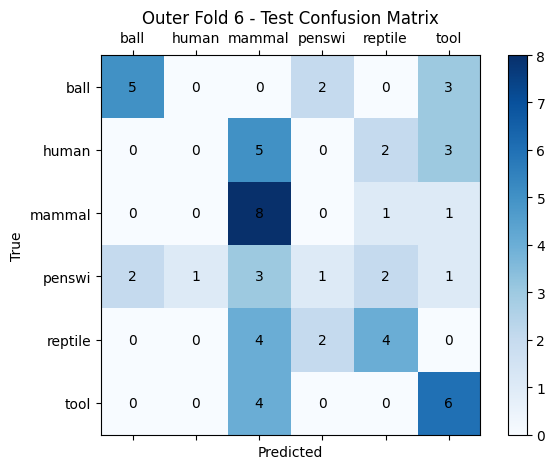


Final Nested Cross-Validation Test Accuracy:
Fold 1: 50.00%
Fold 2: 50.00%
Fold 3: 41.67%
Fold 4: 43.33%
Fold 5: 40.00%
Fold 6: 40.00%

Average Test Accuracy: 44.17%


In [ ]:
import os
import torch
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from model_RDM_extraction import process_video
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import random


def set_seed(seed=42):
    """Sets the seed for all random processes to ensure reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # If using CUDA
    torch.backends.cudnn.deterministic = True  # Ensures reproducibility on GPUs
    torch.backends.cudnn.benchmark = (
        False  # Helps with determinism if you're not using dynamic input sizes
    )


set_seed(42)  # Set seed for reproducibility


def plot_confusion(all_targets, all_preds, classnames, title):
    cm = confusion_matrix(all_targets, all_preds)
    fig, ax = plt.subplots()
    cax = ax.matshow(cm, cmap="Blues")
    plt.title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    fig.colorbar(cax)

    ax.set_xticks(np.arange(len(classnames)))
    ax.set_yticks(np.arange(len(classnames)))
    ax.set_xticklabels(classnames)
    ax.set_yticklabels(classnames)

    # Label cells with counts
    for i in range(len(classnames)):
        for j in range(len(classnames)):
            ax.text(j, i, str(cm[i, j]), va="center", ha="center", color="black")

    plt.tight_layout()
    plt.show()
    plt.close()


class VideoDataset(Dataset):
    def __init__(self, model_name):
        self.model_name = model_name
        self.samples = []

        for fname in sorted(os.listdir("generated_videos")):
            if fname.startswith("processed_"):
                label_str = fname[len("processed_") :].split("_")[0]
                self.samples.append(
                    (os.path.join("generated_videos", fname), label_str)
                )

        self.label_to_idx = {
            label: idx
            for idx, label in enumerate(sorted(set(label for _, label in self.samples)))
        }

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        video_path, label_str = self.samples[idx]
        video_tensor = process_video(self.model_name, video_path)
        label = self.label_to_idx[label_str]
        return video_tensor, label

    def get_labels(self):
        return [label_str for _, label_str in self.samples]


def get_feature(model_name, dataset, device):
    model = torch.hub.load("facebookresearch/pytorchvideo", model_name, pretrained=True)
    backbone = torch.nn.Sequential(*list(model.blocks[:-1])).to(device).eval()

    features, labels = [], []

    with torch.no_grad():
        for video, label in tqdm(dataset):
            if isinstance(video, list):
                video = [v.unsqueeze(0).to(device) for v in video]
            else:
                video = video.unsqueeze(0).to(device)
            feat = backbone(video).view(1, -1)
            features.append(feat.squeeze(0).cpu())
            labels.append(label)

    torch.save((features, labels), "cached_features.pt")
    return features, labels


if __name__ == "__main__":
    model_name = "slowfast_r50"
    device = "mps"  # or "cuda" if using GPU

    dataset = VideoDataset(model_name)

    if os.path.exists("cached_features.pt"):
        features, labels = torch.load("cached_features.pt", weights_only=True)
    else:
        features, labels = get_feature(model_name, device, dataset)

    classnames = np.unique(dataset.get_labels())
    features = torch.stack(features)
    labels = torch.tensor(labels)
    num_classes = len(classnames)

    outer_k = 6  # for outer test fold
    inner_k = 6  # for inner validation fold
    batch_size = 36
    max_epochs = 100
    patience = 10
    learning_rate = 1e-3
    criterion = torch.nn.CrossEntropyLoss()

    outer_skf = StratifiedKFold(n_splits=outer_k, shuffle=True)
    outer_accuracies = []

    for outer_fold, (trainval_idx, test_idx) in enumerate(
        outer_skf.split(features, labels)
    ):
        print(f"\nOuter Fold {outer_fold + 1}")

        trainval_features, test_features = features[trainval_idx], features[test_idx]
        trainval_labels, test_labels = labels[trainval_idx], labels[test_idx]

        # === Inner K-Fold (Validation Split) ===
        inner_skf = StratifiedKFold(n_splits=inner_k, shuffle=True)
        inner_accuracies = []
        inner_models = []

        for inner_fold, (train_idx, val_idx) in enumerate(
            inner_skf.split(trainval_features, trainval_labels)
        ):
            X_train, y_train = trainval_features[train_idx], trainval_labels[train_idx]
            X_val, y_val = trainval_features[val_idx], trainval_labels[val_idx]

            train_loader = DataLoader(
                TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True
            )
            val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

            classifier = torch.nn.Sequential(
                torch.nn.Linear(features.size(1), 512),
                torch.nn.ReLU(),
                torch.nn.Dropout(0.5),
                torch.nn.Linear(512, num_classes),
            ).to(device)
            optimizer = torch.optim.Adam(classifier.parameters(), lr=learning_rate)

            best_val_acc = 0.0
            epochs_no_improve = 0
            best_state_dict = None

            for epoch in range(max_epochs):
                classifier.train()
                correct = 0
                for xb, yb in train_loader:
                    optimizer.zero_grad()
                    outputs = classifier(xb.to(device))
                    loss = criterion(outputs, yb.to(device))
                    loss.backward()
                    optimizer.step()
                    correct += (outputs.argmax(1) == yb.to(device)).sum().item()

                train_acc = correct / len(train_loader.dataset)

                # Validation
                classifier.eval()
                correct = 0
                with torch.no_grad():
                    for xb, yb in val_loader:
                        preds = classifier(xb.to(device)).argmax(dim=1)
                        correct += (preds == yb.to(device)).sum().item()
                val_acc = correct / len(val_loader.dataset)
                # print(f"Epoch {epoch + 1:02d}: Train Acc = {train_acc:.2%}, Val Acc = {val_acc:.2%}")
                if val_acc > best_val_acc:
                    best_val_acc = val_acc
                    best_state_dict = classifier.state_dict()
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1
                    if epochs_no_improve >= patience:
                        break

            print(f"    Inner Fold {inner_fold + 1} Best Val Acc: {best_val_acc:.2%}")
            inner_accuracies.append(best_val_acc)
            inner_models.append(best_state_dict)

        best_inner_fold = np.argmax(inner_accuracies)
        best_model_state = inner_models[best_inner_fold]

        classifier.load_state_dict(best_model_state)
        classifier.eval()

        test_loader = DataLoader(
            TensorDataset(test_features, test_labels), batch_size=batch_size
        )
        correct = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for xb, yb in test_loader:
                preds = classifier(xb.to(device)).argmax(dim=1)
                correct += (preds == yb.to(device)).sum().item()
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(yb.cpu().numpy())

        test_acc = correct / len(test_loader.dataset)
        outer_accuracies.append(test_acc)
        print(f"\nOuter Fold {outer_fold + 1} Test Accuracy: {test_acc:.2%}")
        plot_confusion(
            all_targets,
            all_preds,
            classnames,
            f"Outer Fold {outer_fold + 1} - Test Confusion Matrix",
        )

    # === Final Summary ===
    print("\nFinal Nested Cross-Validation Test Accuracy:")
    for i, acc in enumerate(outer_accuracies):
        print(f"Fold {i + 1}: {acc:.2%}")
    print(f"\nAverage Test Accuracy: {np.mean(outer_accuracies):.2%}")

# same stimuli

In [ ]:
import os
import torch
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from model_RDM_extraction import process_video
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import random


def set_seed(seed=42):
    """Sets the seed for all random processes to ensure reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # If using CUDA
    torch.backends.cudnn.deterministic = True  # Ensures reproducibility on GPUs
    torch.backends.cudnn.benchmark = False


set_seed(42)  # Set seed for reproducibility


def plot_confusion(all_targets, all_preds, classnames, title):
    cm = confusion_matrix(all_targets, all_preds)
    fig, ax = plt.subplots()
    cm = cm[[1, 2, 4, 5, 3, 0], :]
    cm = cm[:, [1, 2, 4, 5, 3, 0]]
    cax = ax.matshow(cm, cmap="Blues")
    plt.title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    fig.colorbar(cax)

    ax.set_xticks(np.arange(len(classnames)))
    ax.set_yticks(np.arange(len(classnames)))
    ax.set_xticklabels(classnames[[1, 2, 4, 5, 3, 0]])
    ax.set_yticklabels(classnames[[1, 2, 4, 5, 3, 0]])

    # Label cells with counts
    for i in range(len(classnames)):
        for j in range(len(classnames)):
            ax.text(j, i, str(cm[i, j]), va="center", ha="center", color="black")

    plt.tight_layout()
    plt.show()
    plt.close()


class VideoDataset(Dataset):
    def __init__(self, model_name, path):
        self.model_name = model_name
        self.samples = []
        self.path = path

        for fname in sorted(os.listdir(self.path)):
            if fname.startswith("processed_"):
                label_str = fname[len("processed_") :].split("_")[0]
                self.samples.append((os.path.join(self.path, fname), label_str))

        self.label_to_idx = {
            label: idx
            for idx, label in enumerate(sorted(set(label for _, label in self.samples)))
        }

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        video_path, label_str = self.samples[idx]
        video_tensor = process_video(self.model_name, video_path)
        label = self.label_to_idx[label_str]
        return video_tensor, label

    def get_labels(self):
        return [label_str for _, label_str in self.samples]


def get_feature(model_name, dataset, device):
    model = torch.hub.load("facebookresearch/pytorchvideo", model_name, pretrained=True)
    backbone = torch.nn.Sequential(*list(model.blocks[:-1])).to(device)
    backbone.eval()

    features, labels = [], []

    with torch.no_grad():
        for video, label in tqdm(dataset):
            if isinstance(video, list):
                video = [v.unsqueeze(0).to(device) for v in video]
            else:
                video = video.unsqueeze(0).to(device)
            feat = backbone(video).view(1, -1)
            features.append(feat.squeeze(0).cpu())
            labels.append(label)

    torch.save((features, labels), f"trained_models/{path}_{model_name}.pt")
    return features, labels


if __name__ == "__main__":
    model_name = "slowfast_r50"
    device = "cpu"  # or "cuda" if using GPU
    path = "generated_videos"

    dataset = VideoDataset(model_name, path)

    if os.path.exists(f"trained_models/{path}_{model_name}.pt"):
        features, labels = torch.load(
            f"trained_models/{path}_{model_name}.pt", weights_only=True
        )
    else:
        features, labels = get_feature(model_name, dataset, device)

    classnames = np.unique(dataset.get_labels())
    features = torch.stack(features)
    labels = torch.tensor(labels)
    num_classes = len(classnames)

    k = 5
    batch_size = 36
    max_epochs = 100
    patience = 10
    learning_rate = 1e-3
    criterion = torch.nn.CrossEntropyLoss()

    skf = StratifiedKFold(n_splits=k, shuffle=True)
    accuracies = []
    models = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(features, labels)):
        X_train, y_train = features[train_idx], labels[train_idx]
        X_val, y_val = features[val_idx], labels[val_idx]

        train_loader = DataLoader(
            TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True
        )
        val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

        classifier = torch.nn.Sequential(
            torch.nn.Linear(features.size(1), 512),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.5),
            torch.nn.Linear(512, num_classes),
        ).to(device)
        optimizer = torch.optim.Adam(classifier.parameters(), lr=learning_rate)

        best_val_acc = 0.0
        epochs_no_improve = 0
        best_state_dict = None

        for epoch in range(max_epochs):
            classifier.train()
            correct = 0
            for xb, yb in train_loader:
                optimizer.zero_grad()
                outputs = classifier(xb.to(device))
                loss = criterion(outputs, yb.to(device))
                loss.backward()
                optimizer.step()
                correct += (outputs.argmax(1) == yb.to(device)).sum().item()

            train_acc = correct / len(train_loader.dataset)

            # Validation
            classifier.eval()
            correct = 0
            with torch.no_grad():
                for xb, yb in val_loader:
                    preds = classifier(xb.to(device)).argmax(dim=1)
                    correct += (preds == yb.to(device)).sum().item()
            val_acc = correct / len(val_loader.dataset)
            print(
                f"Epoch {epoch + 1:02d}: Train Acc = {train_acc:.2%}, Val Acc = {val_acc:.2%}"
            )
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_state_dict = classifier.state_dict()
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    break

        print(f"Fold {fold + 1} Best Val Acc: {best_val_acc:.2%}")
        accuracies.append(best_val_acc)
        models.append(best_state_dict)
        os.makedirs(f"trained_models/{model_name}/", exist_ok=True)
        torch.save(
            best_state_dict, f"trained_models/{model_name}/best_model_fold{fold}.pt"
        )

Epoch 01: Train Acc = 19.10%, Val Acc = 16.67%
Epoch 02: Train Acc = 15.97%, Val Acc = 22.22%
Epoch 03: Train Acc = 20.49%, Val Acc = 19.44%
Epoch 04: Train Acc = 22.22%, Val Acc = 34.72%
Epoch 05: Train Acc = 27.08%, Val Acc = 27.78%
Epoch 06: Train Acc = 28.12%, Val Acc = 41.67%
Epoch 07: Train Acc = 28.82%, Val Acc = 38.89%
Epoch 08: Train Acc = 28.82%, Val Acc = 47.22%
Epoch 09: Train Acc = 28.82%, Val Acc = 41.67%
Epoch 10: Train Acc = 34.03%, Val Acc = 37.50%
Epoch 11: Train Acc = 30.21%, Val Acc = 33.33%
Epoch 12: Train Acc = 29.86%, Val Acc = 50.00%
Epoch 13: Train Acc = 42.36%, Val Acc = 38.89%
Epoch 14: Train Acc = 34.38%, Val Acc = 41.67%
Epoch 15: Train Acc = 32.29%, Val Acc = 47.22%
Epoch 16: Train Acc = 39.58%, Val Acc = 38.89%
Epoch 17: Train Acc = 41.32%, Val Acc = 48.61%
Epoch 18: Train Acc = 38.89%, Val Acc = 48.61%
Epoch 19: Train Acc = 35.76%, Val Acc = 47.22%
Epoch 20: Train Acc = 40.28%, Val Acc = 40.28%
Epoch 21: Train Acc = 38.89%, Val Acc = 47.22%
Epoch 22: Tra

Using cache found in /Users/nastaran/.cache/torch/hub/facebookresearch_pytorchvideo_main
100%|██████████| 36/36 [00:25<00:00,  1.43it/s]

Fold 1 Test Accuracy: 44.44%


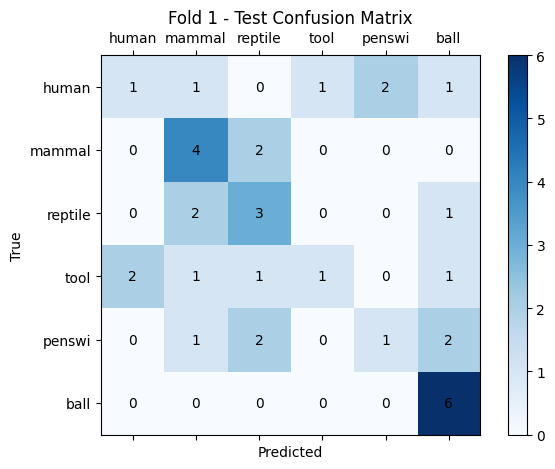

Fold 2 Test Accuracy: 44.44%


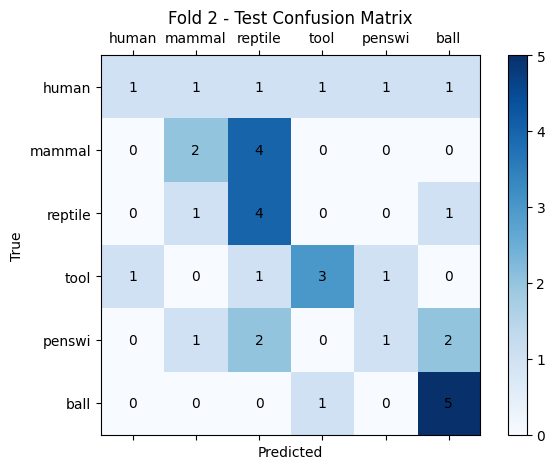

Fold 3 Test Accuracy: 50.00%


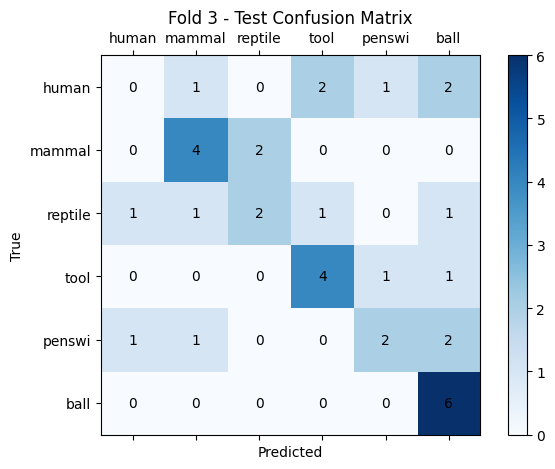

Fold 4 Test Accuracy: 44.44%


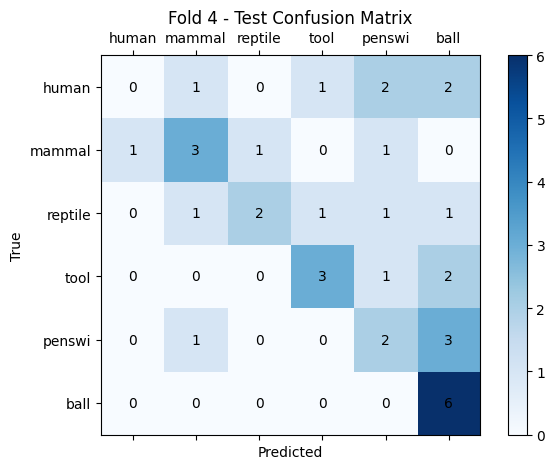

Fold 5 Test Accuracy: 44.44%


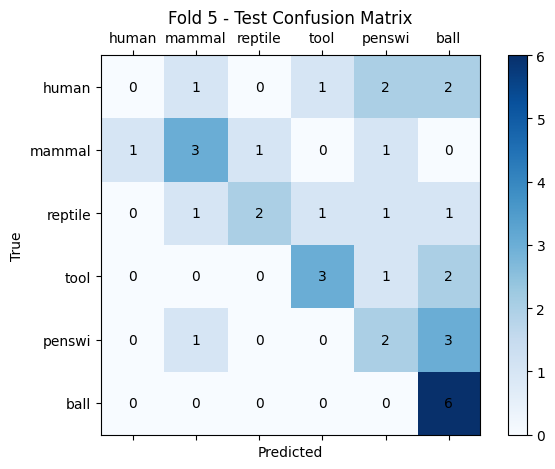

In [ ]:
model_name = "slowfast_r50"

device = "cpu"
path = "stimuli"

dataset = VideoDataset(model_name, path)

if os.path.exists(f"trained_models/{path}_{model_name}.pt"):
    features, labels = torch.load(
        f"trained_models/{path}_{model_name}.pt", weights_only=True
    )
else:
    features, labels = get_feature(model_name, dataset, device)

features = torch.stack(features)
labels = torch.tensor(labels)
classnames = np.unique(dataset.get_labels())

for folds in range(len(models)):
    classifier.load_state_dict(models[folds])
    classifier.eval()

    test_loader = DataLoader(TensorDataset(features, labels), batch_size=batch_size)
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for xb, yb in test_loader:
            preds = classifier(xb.to(device)).argmax(dim=1)
            correct += (preds == yb.to(device)).sum().item()
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(yb.cpu().numpy())

    test_acc = correct / len(test_loader.dataset)
    print(f"Fold {folds + 1} Test Accuracy: {test_acc:.2%}")
    plot_confusion(
        all_targets, all_preds, classnames, f"Fold {folds + 1} - Test Confusion Matrix"
    )